<a href="https://colab.research.google.com/github/edwarddramirez/taxi-forecast/blob/main/notebooks%5CMLP_for_taxi_dropoff_time_series.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
! pip install pyarrow fastparquet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 18.8 MB/s eta 0:00:00


In [3]:
from google.colab import drive # Import the drive module

drive.mount('/content/mnt')


Mounted at /content/mnt


In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

In [5]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {device}')

Using device: cpu


In [7]:
# load data
#ts = pd.read_pickle('data/test/counts_yellow_2023-01_2023-03.pkl')
ts = pd.read_pickle('/content/mnt/MyDrive/Taxi pick up/adjusted_yellow_2022-01_2024-03_bypulocation.pkl')
ts.head()

,PULocationID,pickup_datetime,counts,total_amount,tip_amount,fare_amount,trip_distance,passenger_count,trip_duration
0,4,2022-01-01 00:00:00-05:00,8,23.242388,1.886513,16.681875,3.363750,1.375000,14.481250
1,12,2022-01-01 00:00:00-05:00,1,36.592499,6.088500,25.830000,5.600000,4.000000,22.650000
2,13,2022-01-01 00:00:00-05:00,10,27.196531,3.027030,19.495501,4.386000,1.300000,14.801666
3,24,2022-01-01 00:00:00-05:00,10,18.574230,1.846230,12.915000,2.242000,1.200000,11.380000
4,41,2022-01-01 00:00:00-05:00,9,21.188799,1.549800,15.648334,3.082222,1.777778,13.890740


In [8]:
cutoff_time = pd.to_datetime('2023-10-19 14:00:00-04:00')
print(cutoff_time, type(cutoff_time))
train_data = ts.loc[ts['pickup_datetime'] < cutoff_time]
test_data = ts.loc[ts['pickup_datetime'] >= cutoff_time]
print(len(train_data), len(test_data))
train_data.tail(), test_data.head(), type(train_data), type(test_data)

2023-10-19 14:00:00-04:00 <class 'pandas._libs.tslibs.timestamps.Timestamp'>
987966 248535


(        PULocationID           pickup_datetime  counts  total_amount  \
 987961           246 2023-10-19 13:00:00-04:00      92     24.678804   
 987962           249 2023-10-19 13:00:00-04:00      70     20.981857   
 987963           261 2023-10-19 13:00:00-04:00      36     28.096945   
 987964           262 2023-10-19 13:00:00-04:00      84     20.525953   
 987965           263 2023-10-19 13:00:00-04:00      97     19.822062   
 
         tip_amount  fare_amount  trip_distance  passenger_count  trip_duration  
 987961    3.260326    17.418478       1.985978         1.282609      18.579710  
 987962    2.721857    14.260000       1.543143         1.257143      15.161429  
 987963    3.713611    20.383333       3.054444         1.222222      20.510185  
 987964    2.750952    13.775000       1.968452         1.130952      12.177382  
 987965    2.367423    13.511340       1.843608         1.298969      12.379382  ,
         PULocationID           pickup_datetime  counts  total_amou

## Modelling one zone at first

<ipython-input-9-4ac0ff2d9a6a>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  train_data_1 = train_data[ts['PULocationID'].isin([79])].copy()
<ipython-input-9-4ac0ff2d9a6a>:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  test_data_1 = test_data[ts['PULocationID'].isin([79])].copy()


,pickup_datetime,counts,total_amount,tip_amount,fare_amount,trip_distance,passenger_count,trip_duration
987664,2023-10-19 09:00:00-04:00,69,20.015942,2.739130,13.276812,1.776812,1.101449,12.796618
987727,2023-10-19 10:00:00-04:00,48,19.969791,2.126042,13.895833,1.645000,1.145833,14.285417
987790,2023-10-19 11:00:00-04:00,48,20.844791,2.542708,14.302083,1.639167,1.125000,15.749306
987853,2023-10-19 12:00:00-04:00,50,21.552000,1.986000,15.516000,1.705400,1.260000,16.545666
987916,2023-10-19 13:00:00-04:00,36,22.821388,2.929722,15.891667,1.982500,1.416667,16.132408


,pickup_datetime,counts,total_amount,tip_amount,fare_amount,trip_distance,passenger_count,trip_duration
987979,2023-10-19 14:00:00-04:00,61,21.597050,2.513443,15.083606,1.718033,1.262295,16.132240
988042,2023-10-19 15:00:00-04:00,55,21.632908,2.885637,14.747272,1.627273,1.327273,15.469394
988105,2023-10-19 16:00:00-04:00,65,26.623077,3.400000,16.838461,1.820769,1.630769,18.414871
988168,2023-10-19 17:00:00-04:00,71,23.475351,2.444366,14.495774,1.576901,1.352113,15.493427
988231,2023-10-19 18:00:00-04:00,107,23.903738,3.166449,14.265327,1.580187,1.392523,14.059968


<Axes: xlabel='pickup_datetime'>

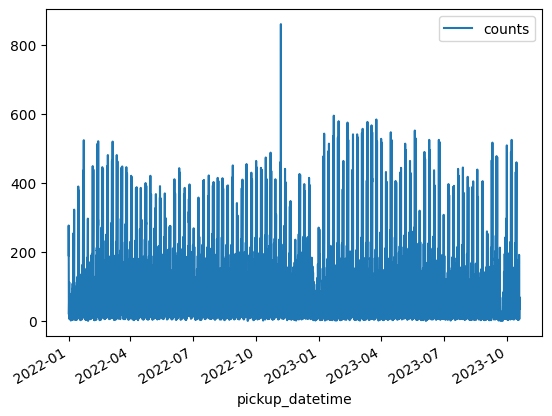

In [9]:
# taxi zone 79

train_data_1 = train_data[ts['PULocationID'].isin([79])].copy()
train_data_1.drop(columns = ['PULocationID'], inplace = True) # PULocationID is constant, drop it
test_data_1 = test_data[ts['PULocationID'].isin([79])].copy()
test_data_1.drop(columns = ['PULocationID'], inplace = True) # PULocationID is constant, drop it
display(train_data_1.tail())
display(test_data_1.head())
train_data_1.plot(x = 'pickup_datetime', y = 'counts')

In [10]:
train_data_1 = train_data_1['counts'].values
test_data_1 = test_data_1['counts'].values
train_data_1.shape, test_data_1.shape

# Normalize data
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
train_data_1 = scaler.fit_transform(train_data_1.reshape(-1, 1))
test_data_1 = scaler.transform(test_data_1.reshape(-1, 1))

# Convert data to PyTorch tensors
train_data_1 = torch.tensor(train_data_1, dtype=torch.float32)
test_data_1 = torch.tensor(test_data_1, dtype=torch.float32)

print(train_data_1.shape)
print(test_data_1.shape)

torch.Size([15682, 1])
torch.Size([3945, 1])


We want to predict the counts for the next hour given the counts for the previous hours, so we create overlapping sliding windows of size one day (24 hours)

In [11]:
sl = 24 # size of each slide (over time)
batch_size = 10

# Prepare the series into list of sequences (pair of input and target sequences)
data = [(train_data_1[i:i+sl], train_data_1[i+1:i+sl+1]) for i in range(0,len(train_data_1)-sl-1,sl)]
print(type(data))
print('N samples: ', len(data))
print('First sample: ', data[0])
print()

# Create Train and Validation sets - fix cutoff index to drop last few obs that are not enough to formm a batch
cut = int(len(data) * 0.8)
print('N samples in train set: ', len(data[:cut]))
print('N samples in validation set: ', len(data[cut:]))
print()

cut_train = cut - (cut % batch_size)
remain = len(data)-cut_train
cut_valid =  remain - (remain % batch_size)

# Create DataLoader for batch processing
train_loader = DataLoader(data[:cut_train], batch_size=batch_size, shuffle=False)
valid_loader = DataLoader(data[cut_train:cut_train + cut_valid], batch_size=batch_size, shuffle=False)

# Check size of Train and Validation sets in the dataloaders
print('N batches in train loader: ', len(list(train_loader)))
print('N batches in validation loader: ', len(list(valid_loader)))
print()


# shape of first batch: 2 stacks
print('shape of first batch (2 stacks) in train set: ')
print('shape of input stack: ', list(train_loader)[0][0].size()) # input
print('shape of target stack: ', list(train_loader)[0][1].size()) # target
print()

# first pair of input & target in the batch
print('first pair of input & target in the first batch in train set: ')
print(list(train_loader)[0][0][0]) # input
print(list(train_loader)[0][1][0]) # target

#Preparing input and target series for test data

test_data_slide = [(test_data_1[i:i+sl], test_data_1[i+1:i+sl+1]) for i in range(0,len(test_data_1)-sl-1,sl)]
print('N samples: ', len(test_data_slide))
print('First sample: ', test_data_slide[0])
print()

#Create test data loader

test_loader = DataLoader(test_data_slide, batch_size=batch_size, shuffle=False)
print('shape of first batch (2 stacks) in test set: ')
print('shape of input stack: ', list(test_loader)[0][0].size()) # input
print('shape of target stack: ', list(test_loader)[0][1].size()) # target
print()
print(list(test_loader)[0][0][0]) # input
print(list(test_loader)[0][1][0]) # target

<class 'list'>
N samples:  653
First sample:  (tensor([[0.2212],
        [0.3213],
        [0.3003],
        [0.2386],
        [0.1362],
        [0.0559],
        [0.0244],
        [0.0233],
        [0.0221],
        [0.0256],
        [0.0314],
        [0.0442],
        [0.0594],
        [0.0594],
        [0.0594],
        [0.0605],
        [0.0757],
        [0.0745],
        [0.0885],
        [0.1036],
        [0.0873],
        [0.1304],
        [0.1024],
        [0.0664]]), tensor([[0.3213],
        [0.3003],
        [0.2386],
        [0.1362],
        [0.0559],
        [0.0244],
        [0.0233],
        [0.0221],
        [0.0256],
        [0.0314],
        [0.0442],
        [0.0594],
        [0.0594],
        [0.0594],
        [0.0605],
        [0.0757],
        [0.0745],
        [0.0885],
        [0.1036],
        [0.0873],
        [0.1304],
        [0.1024],
        [0.0664],
        [0.0885]]))

N samples in train set:  522
N samples in validation set:  131

N batches in train l

### MLP Model for zone 79

We use a simple feed forward neural network with a single hidden layer and ReLU activation and dropout after the first layer during training for robustness. We also use a learning rate scheduler and early stopping during training.

In [22]:
class MLP(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, dropout_prob):
        super(MLP, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.fc2 = nn.Linear(hidden_size, output_size)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(dropout_prob) # Dropout layer


    def forward(self, x):
        out = self.fc1(x)
        out = self.relu(out)
        out = self.dropout(out) # Apply dropout after activation
        out = self.fc2(out)
        return out

In [23]:
input_size = 1
hidden_size = 32
output_size = 1
dropout_prob = 0.2

model = MLP(input_size, hidden_size, output_size, dropout_prob)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=50, gamma=0.1)

In [24]:
# Training loop for single series MLP
num_epochs = 1000

## to keep track of if validation loss went up
times_valid_loss_went_up_in_a_row = 0

## an initial value
min_valid_loss = float("inf")

valid_loss_list = []

for epoch in range(num_epochs):
    ## Train
    model.train()
    epoch_train_loss = 0
    for batch_X, batch_y in train_loader:
        preds = model(batch_X)
        train_loss = criterion(preds, batch_y)

        optimizer.zero_grad()
        train_loss.backward()
        optimizer.step()

        epoch_train_loss += train_loss.item()

    avg_train_loss = epoch_train_loss / len(train_loader)
    scheduler.step()

  ## Validate
    model.eval()
    epoch_valid_loss = 0
    with torch.no_grad():
        for batch_X, batch_y in valid_loader:
            preds = model(batch_X)
            valid_loss = criterion(preds, batch_y)

            epoch_valid_loss += valid_loss.item()

    avg_valid_loss = epoch_valid_loss / len(valid_loader)

    ## print out Train and Valiation loss for every 10 epochs
    if (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Train Loss: {avg_train_loss}, Validation Loss: {avg_valid_loss}')

    ## Early Stopping: check if the error went up or down
    valid_loss_list.append(avg_valid_loss)

# if it went down
    if valid_loss_list[-1] < min_valid_loss:
        # record the new minimum val error
        min_valid_loss = valid_loss_list[-1]

        # reset our up counter
        times_valid_loss_went_up_in_a_row = 0
    # if it went up
    else:
        # add to the counter
        times_valid_loss_went_up_in_a_row = times_valid_loss_went_up_in_a_row + 1
        # if this is the 300th time in a row it has gone up
        if times_valid_loss_went_up_in_a_row == 300:
            # stop early
            break

Epoch [10/1000], Train Loss: 0.0026047975586082498, Validation Loss: 0.0015027676126919687
Epoch [20/1000], Train Loss: 0.0021457193517842544, Validation Loss: 0.001478451044441989
Epoch [30/1000], Train Loss: 0.00207460037983345, Validation Loss: 0.0014737648710321921
Epoch [40/1000], Train Loss: 0.0020714349397726785, Validation Loss: 0.0014585107430600775
Epoch [50/1000], Train Loss: 0.002041091298451647, Validation Loss: 0.0014621675498067187
Epoch [60/1000], Train Loss: 0.0019895996979007926, Validation Loss: 0.0014678552173651182
Epoch [70/1000], Train Loss: 0.002051929201115854, Validation Loss: 0.00146980148453552
Epoch [80/1000], Train Loss: 0.0020149902456278843, Validation Loss: 0.001465856867770736
Epoch [90/1000], Train Loss: 0.0020225370378914075, Validation Loss: 0.00146938936981874
Epoch [100/1000], Train Loss: 0.001946114315964783, Validation Loss: 0.0014635051081243616
Epoch [110/1000], Train Loss: 0.002019616514399576, Validation Loss: 0.0014683757863867169
Epoch [12

## Evaluating the model for zone 79

MSE: 1387.6370849609375


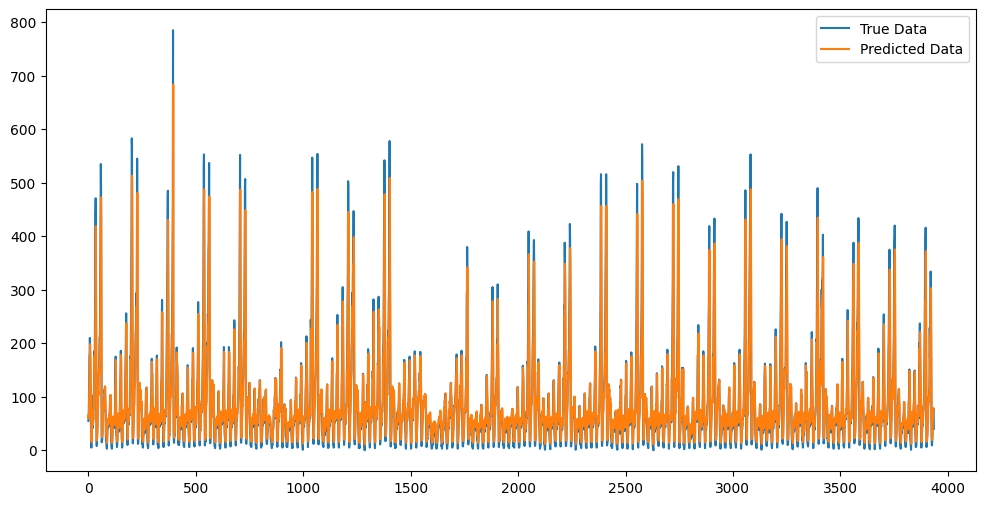

In [25]:
model.eval()
with torch.no_grad():
    test_preds = []
    test_labels = []

    for batch_X, batch_y in test_loader:
        preds = model(batch_X)
        test_preds.append(preds)
        test_labels.append(batch_y)

    test_preds = torch.cat(test_preds, dim=0)
    test_labels = torch.cat(test_labels, dim=0)


    # Inverse transform to get the original scale
    test_preds = scaler.inverse_transform(test_preds.numpy().reshape(-1, 1))
    test_labels = scaler.inverse_transform(test_labels.numpy().reshape(-1, 1))
    test_loss = mean_squared_error(test_preds, test_labels)
    print(f'MSE: {test_loss}')

    plt.figure(figsize=(12, 6))
    plt.plot(range(len(test_labels)), test_labels, label='True Data')
    plt.plot(range(len(test_preds)), test_preds, label='Predicted Data')
    plt.legend()
    plt.show()

# Hyperparameter tuning using RandomizedSearchCV based on zone 79 data

In [16]:
from sklearn.base import BaseEstimator
class PyTorchModelWrapper(BaseEstimator):
    def __init__(self, hidden_size = 64,dropout_prob =0.2, lr = 0.01, gamma = 0.1, step_size =10, num_epochs=100, input_size=1, output_size=1):
        self.input_size = input_size
        self.hidden_size = hidden_size
        self.output_size = output_size
        self.dropout_prob = dropout_prob
        self.lr = lr
        self.gamma = gamma
        self.step_size = step_size
        self.num_epochs = num_epochs
        self.model = MLP(input_size, hidden_size, output_size, dropout_prob)
        self.criterion = nn.MSELoss()
        self.optimizer = optim.Adam(self.model.parameters(), lr=self.lr)
        self.scheduler = optim.lr_scheduler.StepLR(self.optimizer, step_size=step_size, gamma=gamma)

    def fit(self, X, y):
        # Convert data to PyTorch tensors
        X_tensor = torch.tensor(X, dtype=torch.float32)
        y_tensor = torch.tensor(y, dtype=torch.float32)

        # Training loop
        for epoch in range(self.num_epochs):
            for batch_X, batch_y in train_loader: # Iterate over batches
                outputs = self.model(batch_X)
                loss = self.criterion(outputs, batch_y)
                self.optimizer.zero_grad()
                loss.backward()
                self.optimizer.step()
            self.scheduler.step()
        return self

    def predict(self, X):
        # Convert data to PyTorch tensor
        X_tensor = torch.tensor(X, dtype=torch.float32)

        # Make predictions
        self.model.eval()
        with torch.no_grad():
            predictions = self.model(X_tensor)
        return predictions.detach().cpu().numpy().flatten()

    def score(self, X, y):
        # Calculate MSE loss
        predictions = self.predict(X)
        print(predictions.shape, type(predictions))
        print(y.shape, type(y))
        loss = np.mean((predictions - y) ** 2)
        return -loss  # Return negative MSE for maximization

In [17]:
param_grid = {
    'hidden_size': [32, 64, 128],
    'dropout_prob': [0.2, 0.5],
    'num_epochs': [400],
    'lr': [0.01, 0.001, 0.05],
    'step_size': [10, 30, 50],
    'gamma': [0.1, 0.5]
}


In [19]:
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import TimeSeriesSplit

def custom_scorer(estimator, X, y):
  fold_scores = []
  for train_index in range(len(X_train)):
      X_train, X_test = X[train_index], X[train_index+1]
      y_train, y_test = y[train_index], y[train_index+1]

      estimator.epochs_per_fold = 50  # Adjust as needed
      estimator.fit(X_train, y_train)
      y_pred = estimator.predict(X_test)

      fold_scores.append(mean_squared_error(y_test, y_pred))
      print(y_pred.shape, y_test.shape)

  return -np.mean(fold_scores)  # Return negative MSE for maximization

In [21]:
from sklearn.model_selection import RandomizedSearchCV

# Create PyTorchModelWrapper instance
wrapper = PyTorchModelWrapper(input_size=1, output_size=1)
random_search = RandomizedSearchCV(wrapper, param_grid, scoring=custom_scorer, n_jobs=-1)

# Extract data from train_loader
X_train = []
y_train = []
for batch_X, batch_y in train_loader:
    X_train.append(batch_X.numpy())
    y_train.append(batch_y.numpy())

# Concatenate batches into NumPy arrays
X_train = np.concatenate(X_train, axis=0)
y_train = np.concatenate(y_train, axis=0)

# Fit using NumPy arrays
random_search.fit(X_train, y_train)

# Get best hyperparameters and model
best_params = random_search.best_params_
best_model = random_search.best_estimator_
print("Best Hyperparameters:", best_params)

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan]
  warnings.warn(


Best Hyperparameters: {'step_size': 50, 'num_epochs': 400, 'lr': 0.001, 'hidden_size': 32, 'gamma': 0.1, 'dropout_prob': 0.2}


### **MLP model for all Manhattan Zones**

In [28]:
zones = ts.PULocationID.unique()
print('Zones', zones)
print('Number of Manhattan zones', len(zones))

Zones [  4  12  13  24  41  42  43  45  48  50  68  74  75  79  87  88  90 100
 107 113 114 116 120 125 127 128 137 140 141 142 143 144 148 151 152 158
 161 162 163 164 166 170 186 209 211 224 229 230 231 232 233 234 236 237
 238 239 243 244 246 249 261 262 263]
Number of Manhattan zones 63


Training for all zones

In [29]:
#training models for all zones

input_size = 1
hidden_size = 32
output_size = 1
dropout_prob = 0.2
models = {}
test_loaders={}
times = {}
scalers={}

for zone in zones:
    train_zone = train_data[train_data['PULocationID'].isin([zone])].copy()
    train_zone.drop(columns = ['PULocationID'], inplace = True)

    test_zone = test_data[test_data['PULocationID'].isin([zone])].copy()
    test_zone.drop(columns = ['PULocationID'], inplace = True)

    train_zone_data = train_zone['counts'].values
    test_zone_data = test_zone['counts'].values
    test_zone_time = test_zone['pickup_datetime'].values

    # Normalize data
    scaler_zone = MinMaxScaler()
    train_zone_data = scaler_zone.fit_transform(train_zone_data.reshape(-1, 1))
    test_zone_data = scaler_zone.transform(test_zone_data.reshape(-1, 1))

    # Convert data to PyTorch tensors
    train_zone_data = torch.tensor(train_zone_data, dtype=torch.float32)
    test_zone_data = torch.tensor(test_zone_data, dtype=torch.float32)

    #Prepare sliding window time series

    sl = 24 # size of each slide (over time)
    batch_size = 10

    # Prepare the series into list of sequences (pair of input and target sequences)
    train_zone_data = [(train_zone_data[i:i+sl], train_zone_data[i+1:i+sl+1]) for i in range(0,len(train_zone_data)-sl-1,sl)]

    # Create Train and Validation sets - fix cutoff index to drop last few obs that are not enough to formm a batch
    cut = int(len(train_zone_data) * 0.8)

    cut_train = cut - (cut % batch_size)
    remain = len(train_zone_data)-cut_train
    cut_valid =  remain - (remain % batch_size)

    # Create DataLoader for batch processing
    train_loader = DataLoader(train_zone_data[:cut_train], batch_size=batch_size, shuffle=False)
    valid_loader = DataLoader(train_zone_data[cut_train:cut_train + cut_valid], batch_size=batch_size, shuffle=False)

    #Create test dataloader

    test_data_slide = [(test_zone_data[i:i+sl], test_zone_data[i+1:i+sl+1]) for i in range(0,len(test_zone_data)-sl-1,sl)]
    test_loader = DataLoader(test_data_slide, batch_size=batch_size, shuffle=False)

    #Instantiate new MLP model for each zone

    model = MLP(input_size, hidden_size, output_size, dropout_prob)
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=50, gamma=0.1)

    # Training loop for MLP for this zone
    num_epochs = 1000

    ## to keep track of if validation loss went up
    times_valid_loss_went_up_in_a_row = 0

    ## an initial value
    min_valid_loss = float("inf")

    valid_loss_list = []

    for epoch in range(num_epochs):
        ## Train
        model.train()
        epoch_train_loss = 0
        for batch_X, batch_y in train_loader:
            preds = model(batch_X)
            train_loss = criterion(preds, batch_y)

            optimizer.zero_grad()
            train_loss.backward()
            optimizer.step()

            epoch_train_loss += train_loss.item()

        avg_train_loss = epoch_train_loss / len(train_loader)
        scheduler.step()

      ## Validate
        model.eval()
        epoch_valid_loss = 0
        with torch.no_grad():
            for batch_X, batch_y in valid_loader:
                preds = model(batch_X)
                valid_loss = criterion(preds, batch_y)

                epoch_valid_loss += valid_loss.item()

        avg_valid_loss = epoch_valid_loss / len(valid_loader)

        ## print out Train and Valiation loss for every 10 epochs
        if (epoch+1) % 10 == 0:
            print(f'Zone:{zone}, Epoch [{epoch+1}/{num_epochs}], Train Loss: {avg_train_loss}, Validation Loss: {avg_valid_loss}')

        ## Early Stopping: check if the error went up or down
        valid_loss_list.append(avg_valid_loss)

        # if it went down
        if valid_loss_list[-1] < min_valid_loss:
            # record the new minimum val error
            min_valid_loss = valid_loss_list[-1]

            # reset our up counter
            times_valid_loss_went_up_in_a_row = 0
        # if it went up
        else:
            # add to the counter
            times_valid_loss_went_up_in_a_row = times_valid_loss_went_up_in_a_row + 1
            # if this is the 50th time in a row it has gone up
            if times_valid_loss_went_up_in_a_row == 300:
                # stop early
                break

    # Save the model for this zone in dictionary
    models[zone] = model
    scalers[zone] = scaler_zone
    test_loaders[zone] = test_loader
    times[zone] = test_zone_time
    print(f'Zone:{zone} model saved, Final validation loss:{avg_valid_loss} ')

Zone:4, Epoch [10/1000], Train Loss: 0.004130046248274784, Validation Loss: 0.004091857807137645
Zone:4, Epoch [20/1000], Train Loss: 0.0037502823599005262, Validation Loss: 0.004043761703472298
Zone:4, Epoch [30/1000], Train Loss: 0.003624057786789938, Validation Loss: 0.004026858485303819
Zone:4, Epoch [40/1000], Train Loss: 0.0036469444972821153, Validation Loss: 0.003949927049688995
Zone:4, Epoch [50/1000], Train Loss: 0.0036047094864233467, Validation Loss: 0.0039546015815666085
Zone:4, Epoch [60/1000], Train Loss: 0.0036623255336263147, Validation Loss: 0.003968816528168435
Zone:4, Epoch [70/1000], Train Loss: 0.0035456395383404856, Validation Loss: 0.003969496787668994
Zone:4, Epoch [80/1000], Train Loss: 0.003626517029120945, Validation Loss: 0.003970166722026009
Zone:4, Epoch [90/1000], Train Loss: 0.0035756750327821532, Validation Loss: 0.003965790007406702
Zone:4, Epoch [100/1000], Train Loss: 0.0036591502463964457, Validation Loss: 0.003976070537016942
Zone:4, Epoch [110/10

In [30]:
#Symmetric mean absolute percentage error
def smape(y, y_pred):
    # From pytorch-forecasting
    return np.mean(2*np.abs(y - y_pred) / (np.abs(y) + np.abs(y_pred)))

# Model evaluation and graphs for each zone

Zone:4, MSE: 21.096088409423828, SMAPE: 0.9071258306503296


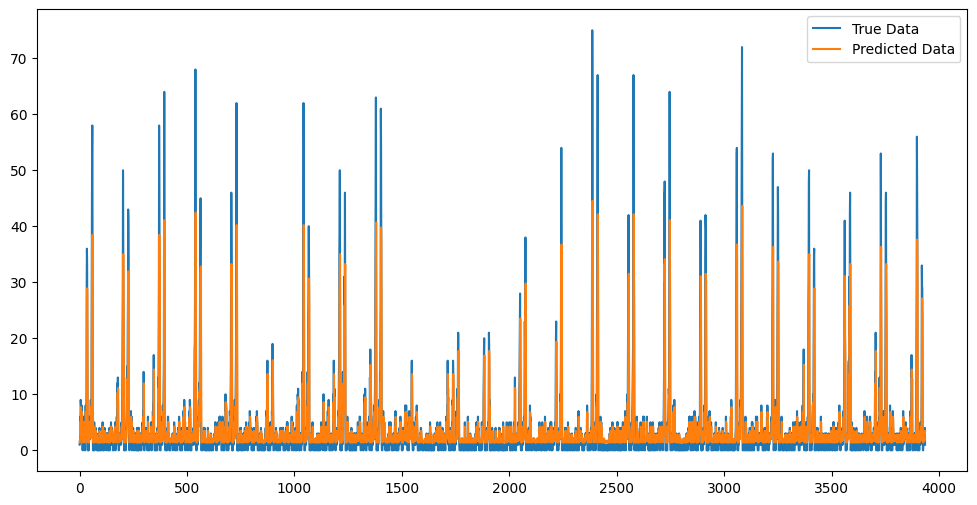

Zone:12, MSE: 2.8058598041534424, SMAPE: 1.459071159362793


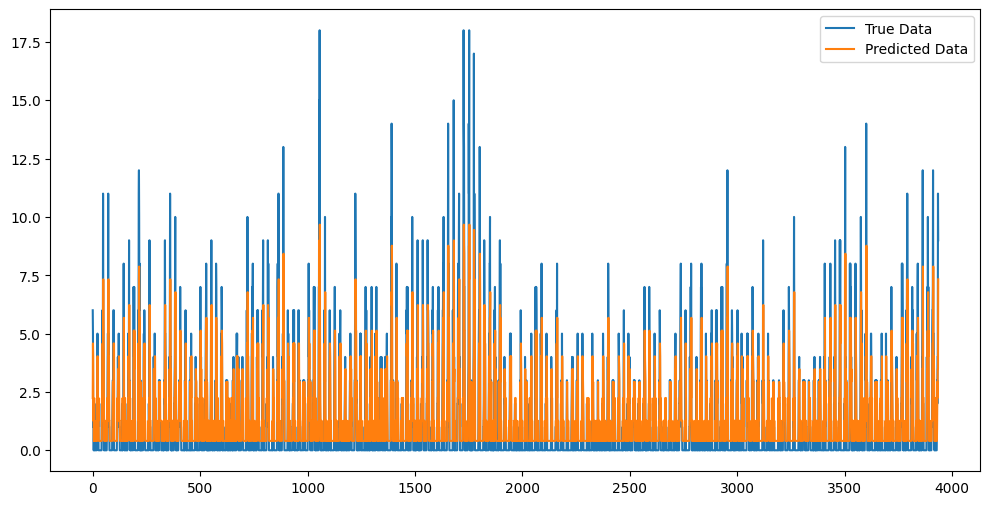

Zone:13, MSE: 75.39259338378906, SMAPE: 0.6835830211639404


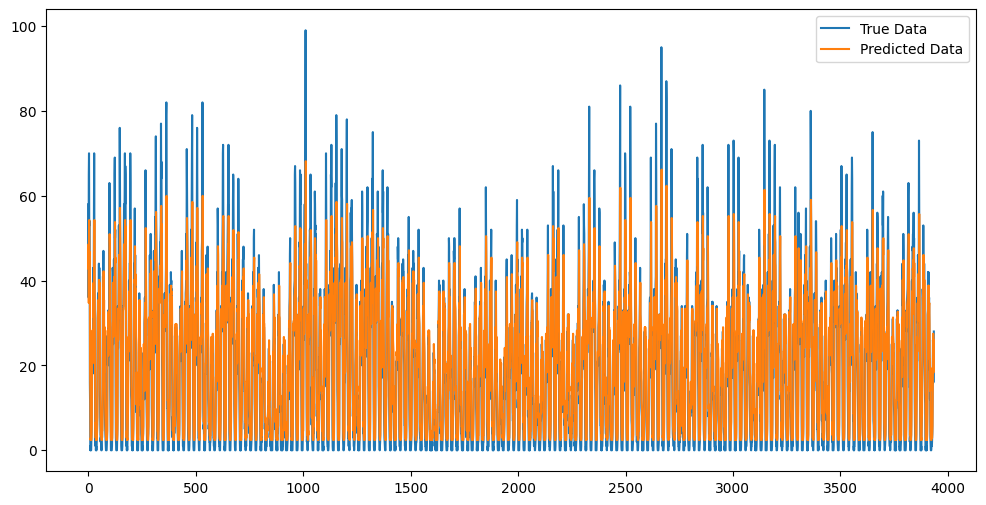

Zone:24, MSE: 24.54859733581543, SMAPE: 0.6248220801353455


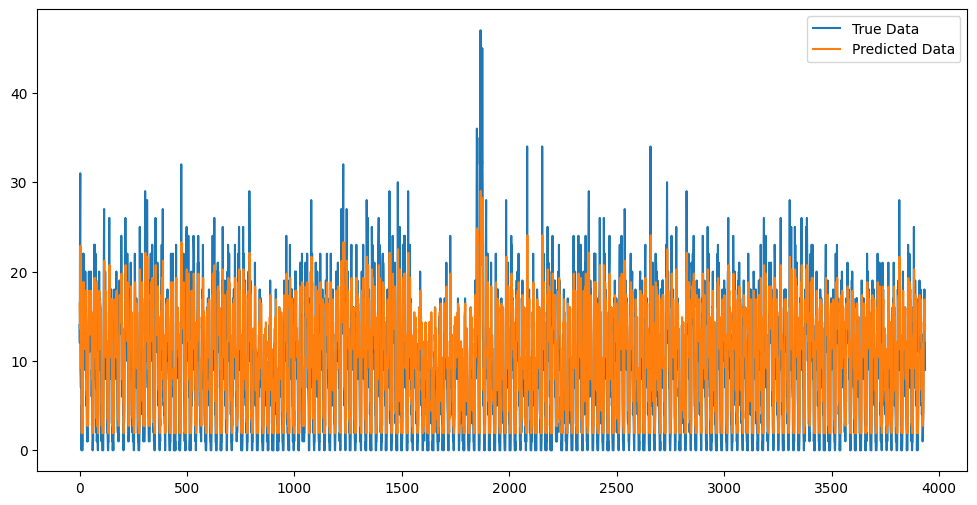

Zone:41, MSE: 19.908782958984375, SMAPE: 0.6557195782661438


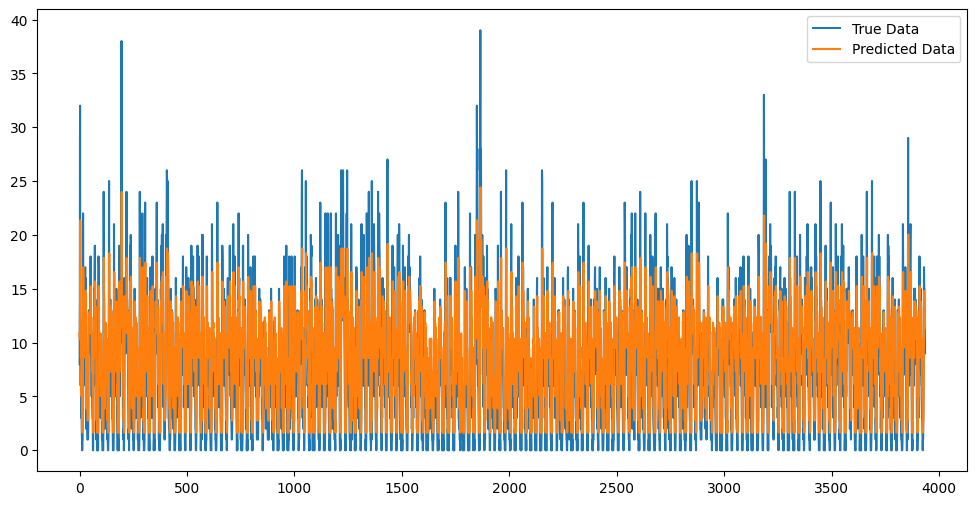

Zone:42, MSE: 4.320105075836182, SMAPE: 0.8450709581375122


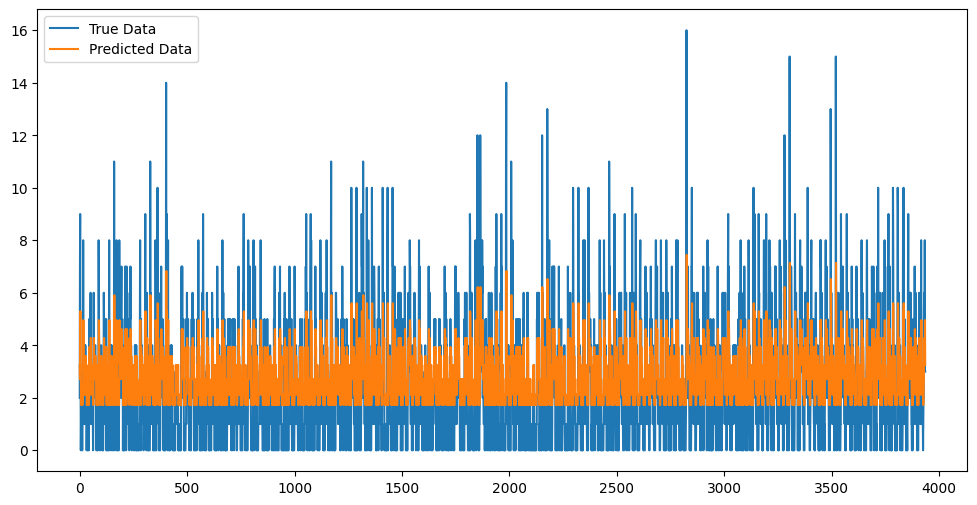

Zone:43, MSE: 653.5792236328125, SMAPE: 0.6181620359420776


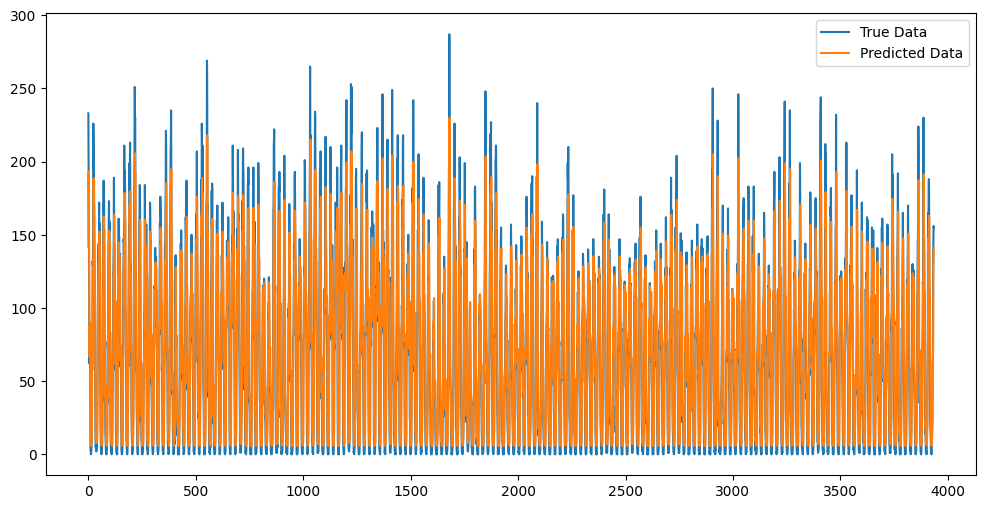

Zone:45, MSE: 7.940330982208252, SMAPE: 0.7849180698394775


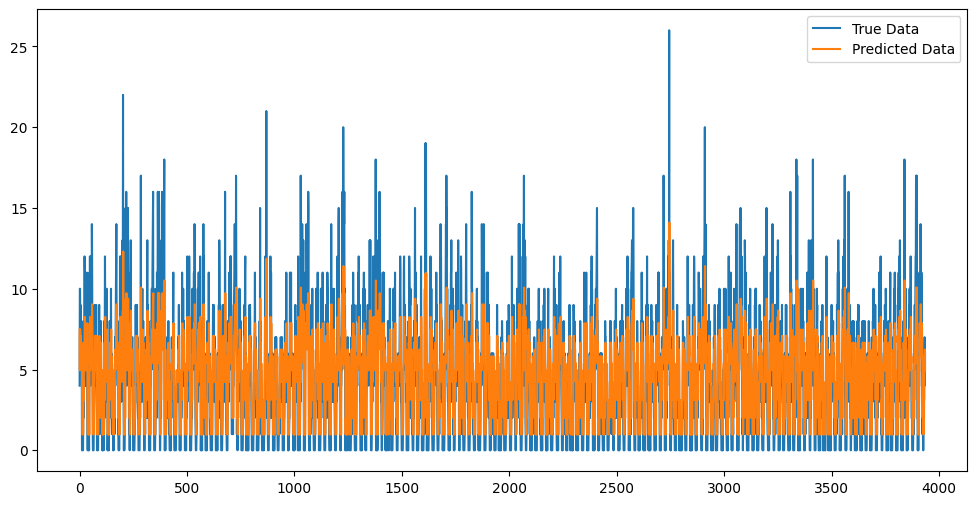

Zone:48, MSE: 860.1139526367188, SMAPE: 0.2801026403903961


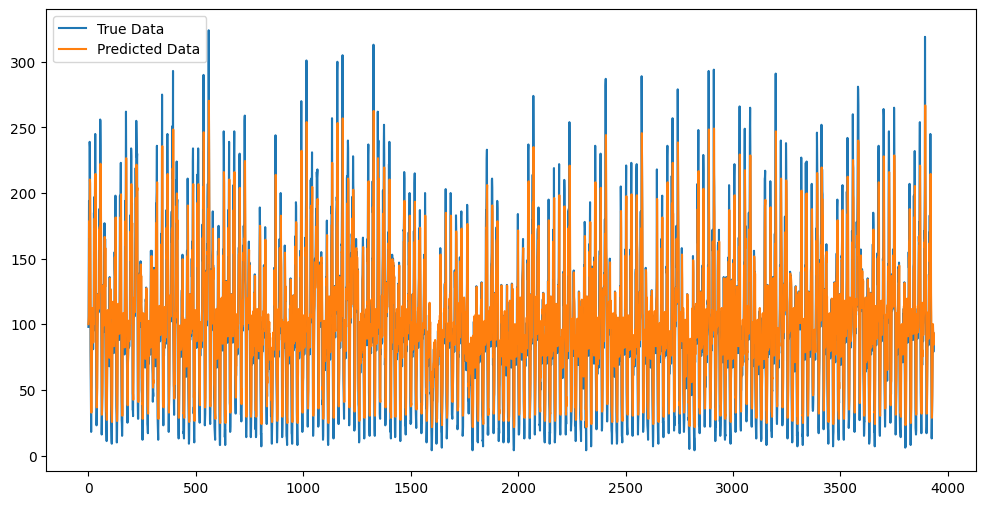

Zone:50, MSE: 85.64366149902344, SMAPE: 0.47231554985046387


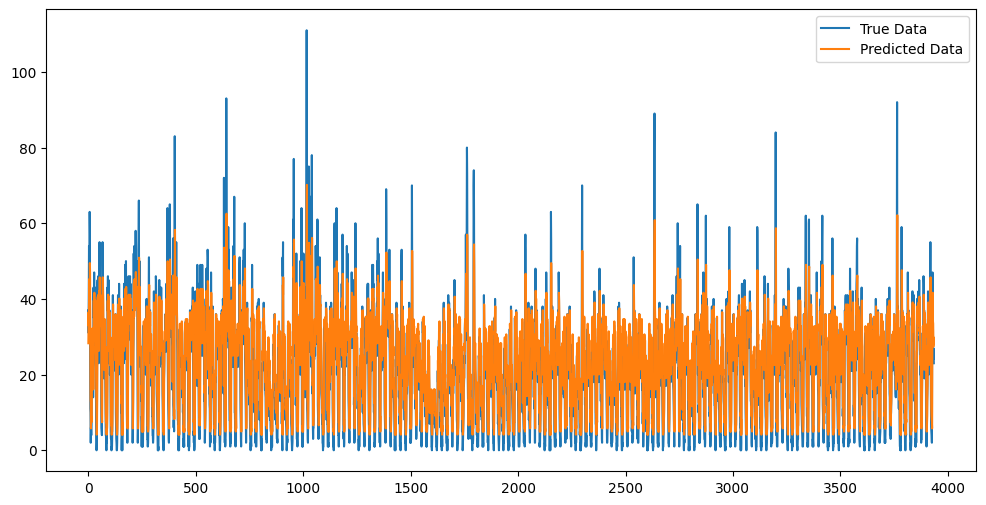

Zone:68, MSE: 772.5818481445312, SMAPE: 0.3427656888961792


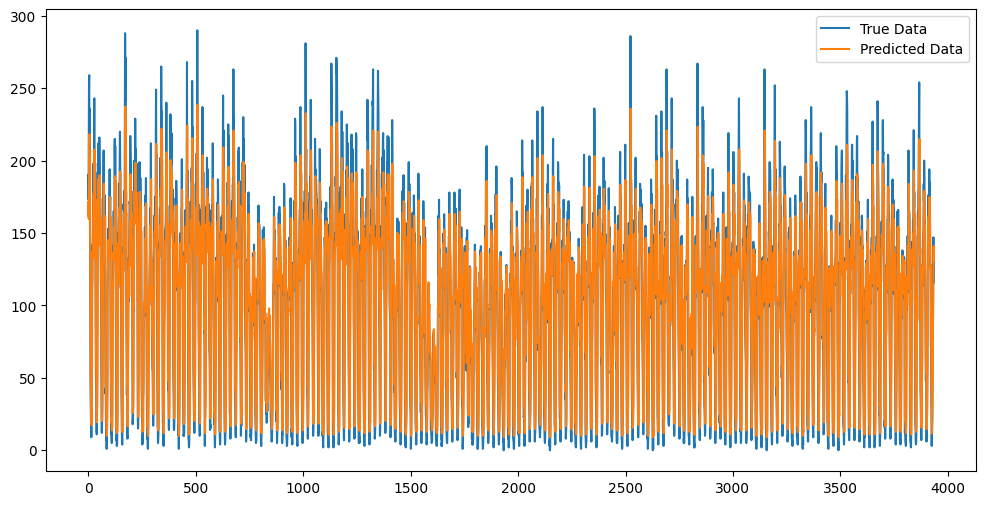

Zone:74, MSE: 14.90623950958252, SMAPE: 0.609912633895874


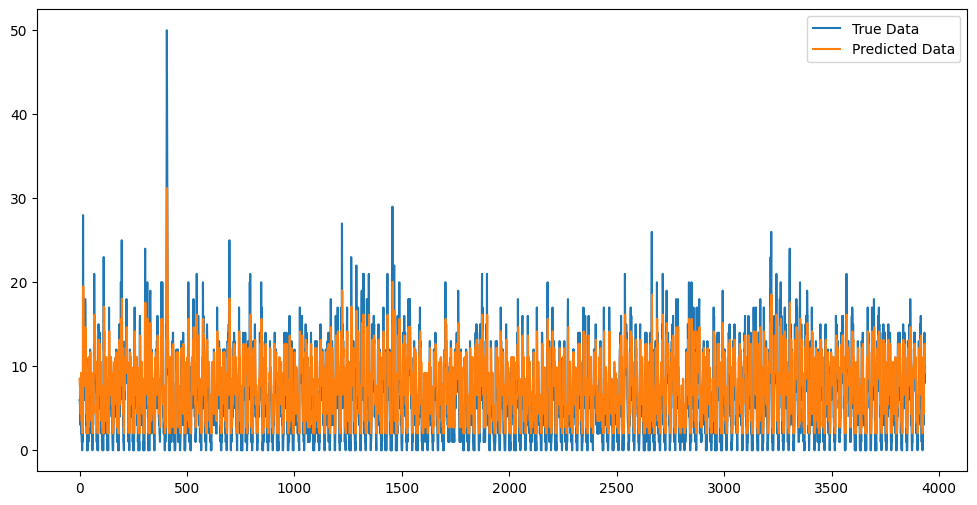

Zone:75, MSE: 69.004638671875, SMAPE: 0.5114981532096863


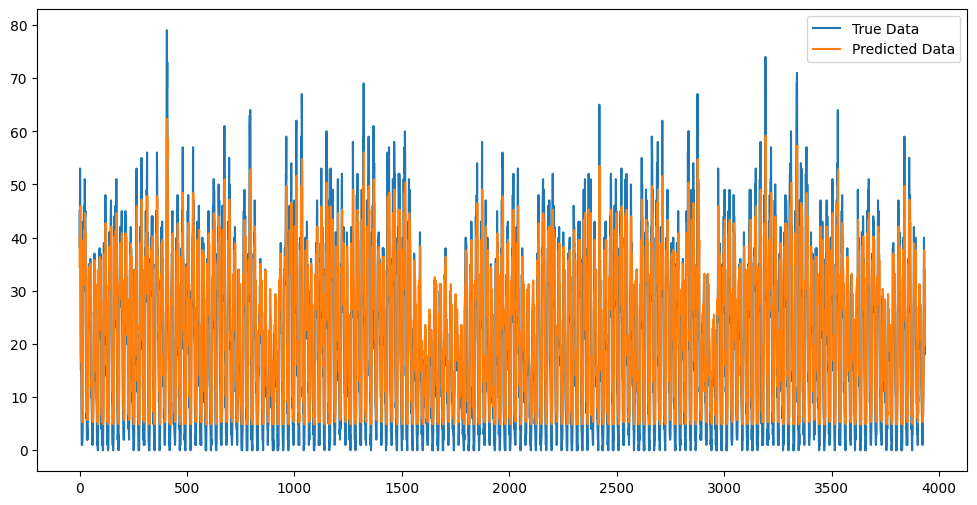

Zone:79, MSE: 1429.628173828125, SMAPE: 0.3775118589401245


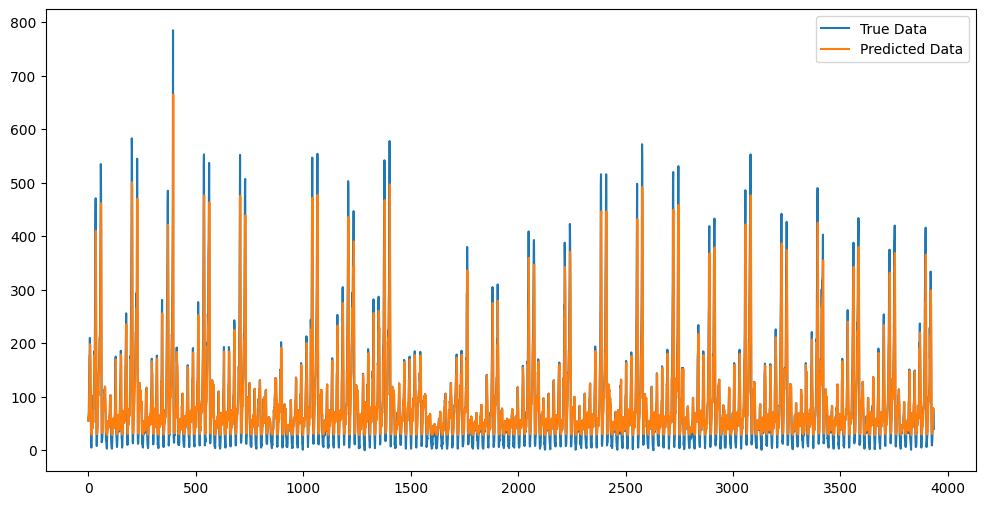

Zone:87, MSE: 48.4483528137207, SMAPE: 0.5520106554031372


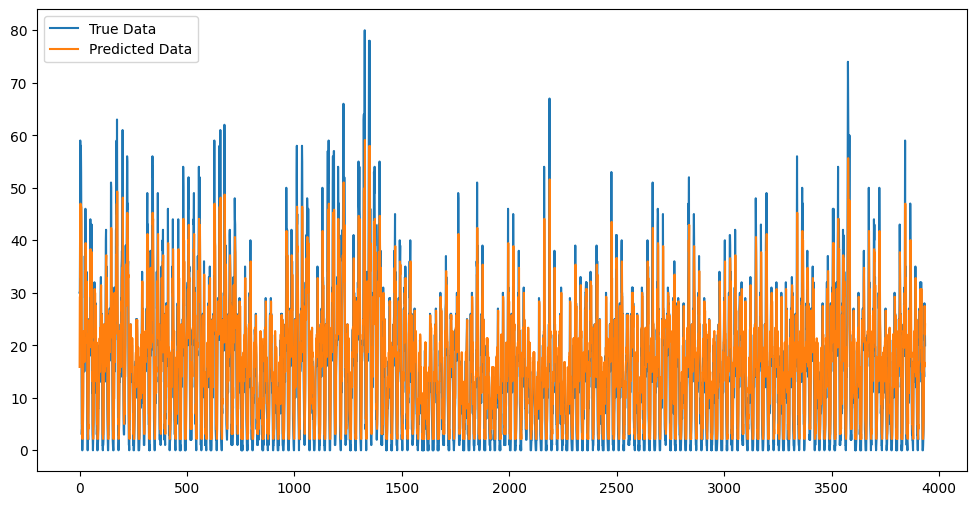

Zone:88, MSE: 21.614198684692383, SMAPE: 0.6750614643096924


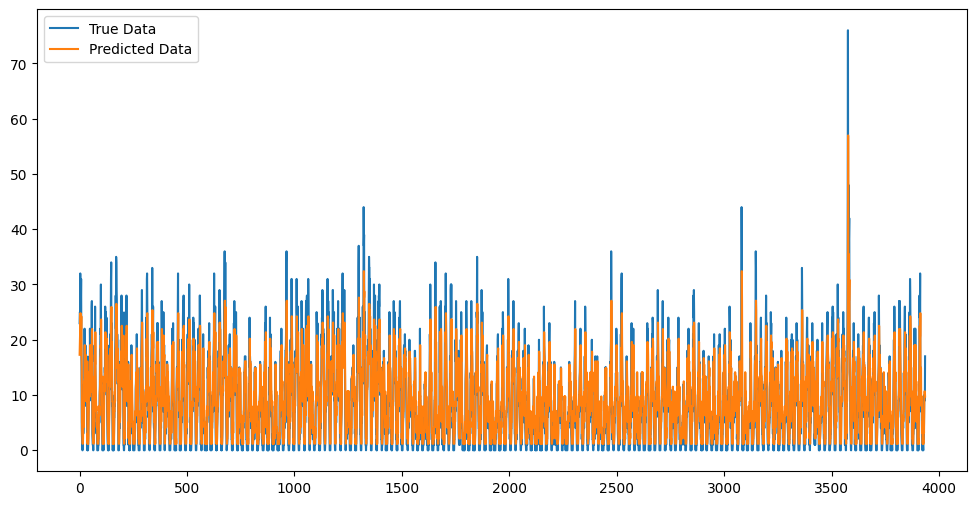

Zone:90, MSE: 327.4091796875, SMAPE: 0.3783499300479889


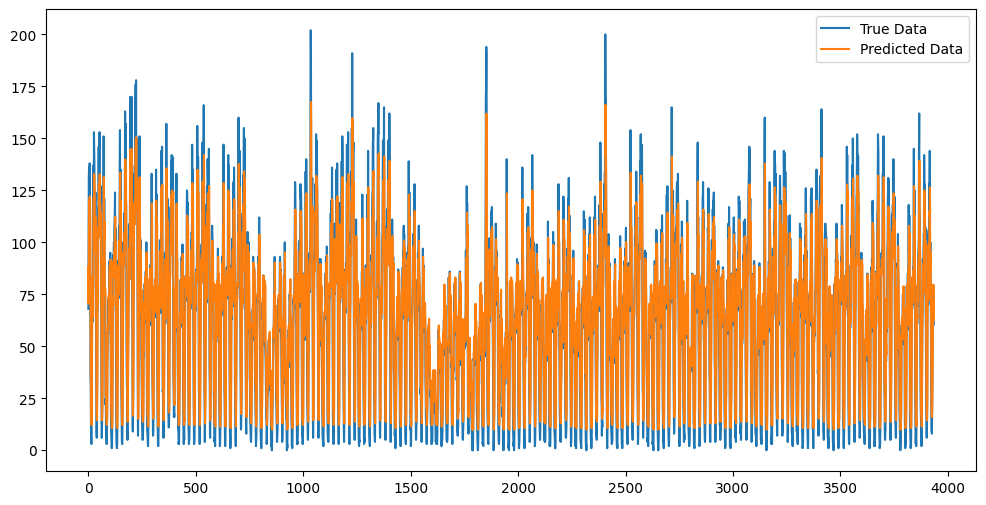

Zone:100, MSE: 347.8537902832031, SMAPE: 0.3563746511936188


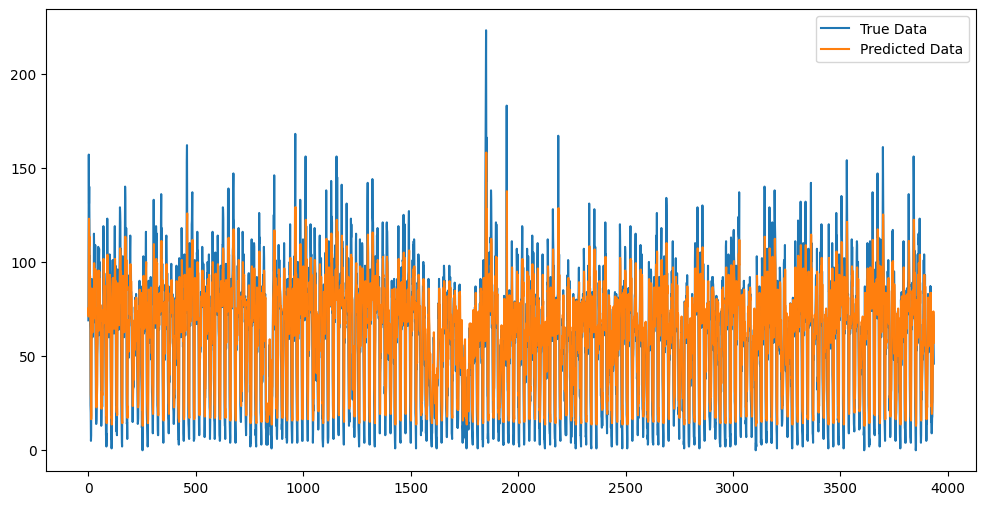

Zone:107, MSE: 540.1597900390625, SMAPE: 0.3622397482395172


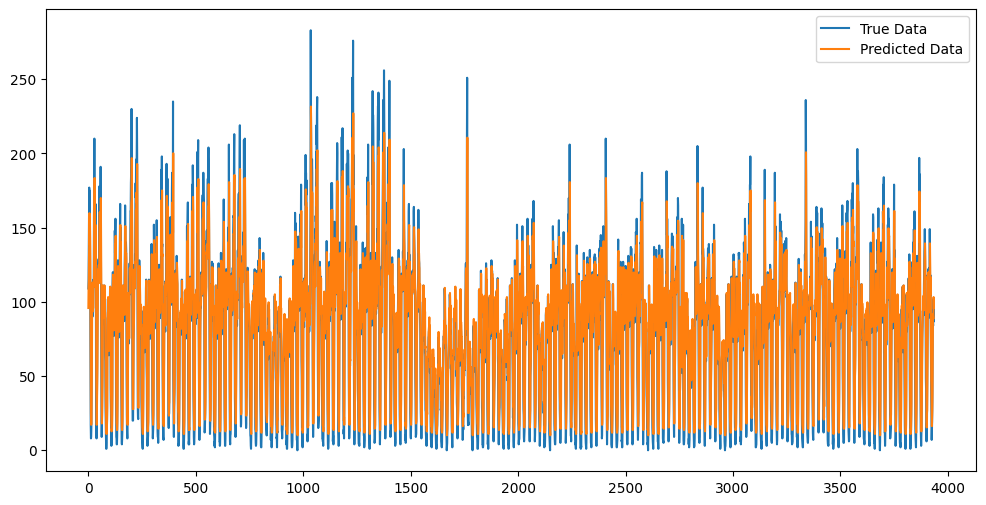

Zone:113, MSE: 296.2550964355469, SMAPE: 0.4573298394680023


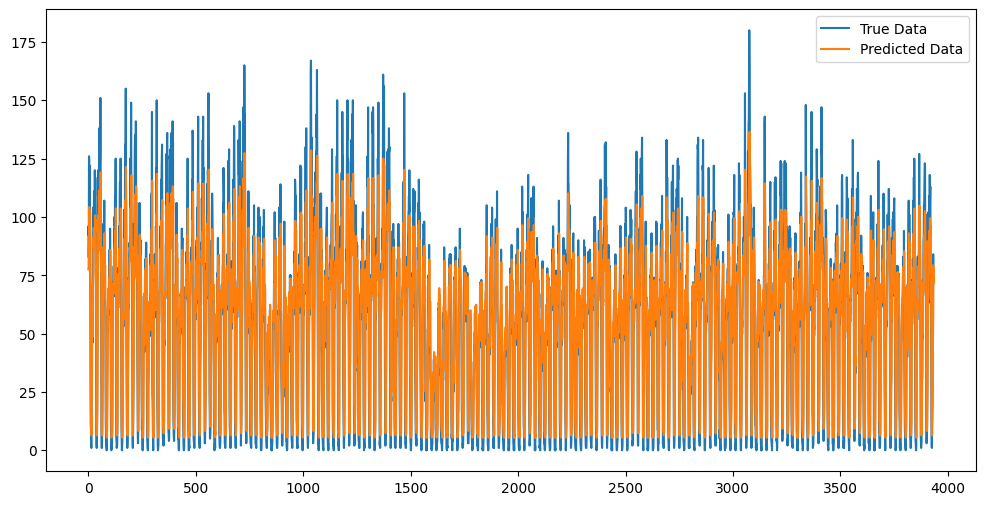

Zone:114, MSE: 716.5506591796875, SMAPE: 0.43828848004341125


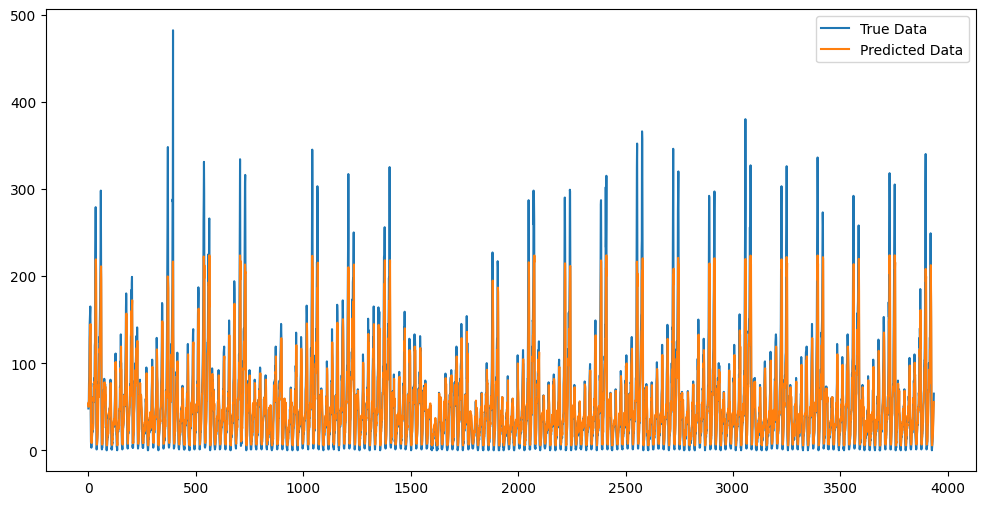

Zone:116, MSE: 4.019857406616211, SMAPE: 0.9252099394798279


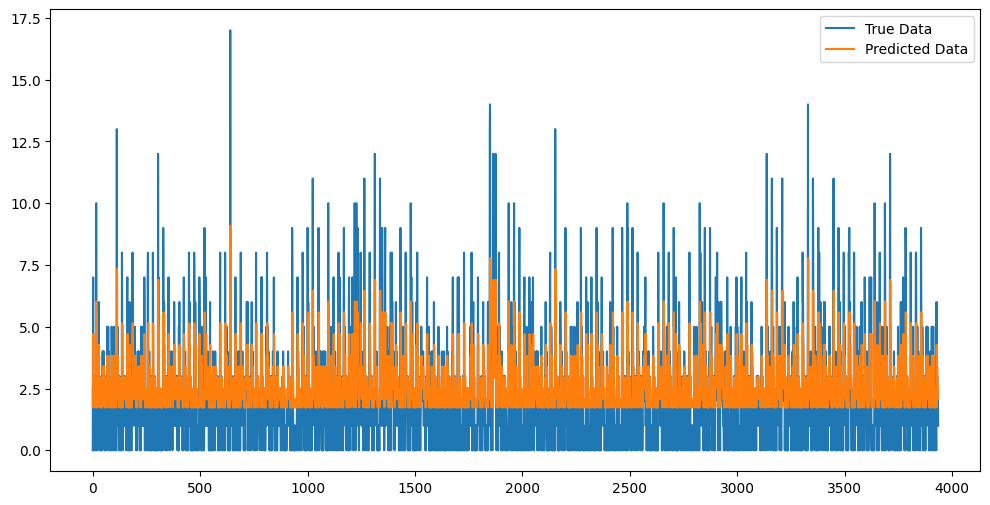

Zone:120, MSE: 0.009070774540305138, SMAPE: 1.9996402263641357


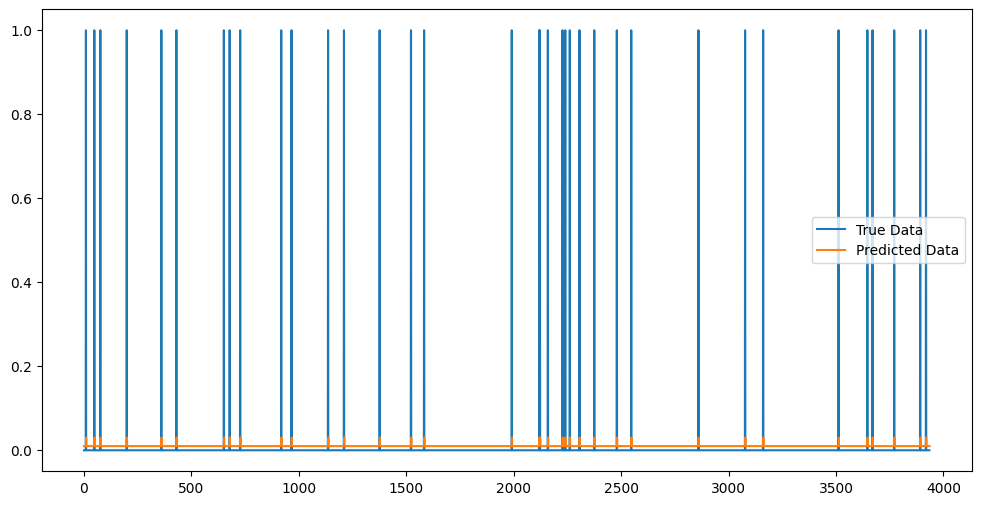

Zone:125, MSE: 53.484092712402344, SMAPE: 0.46772223711013794


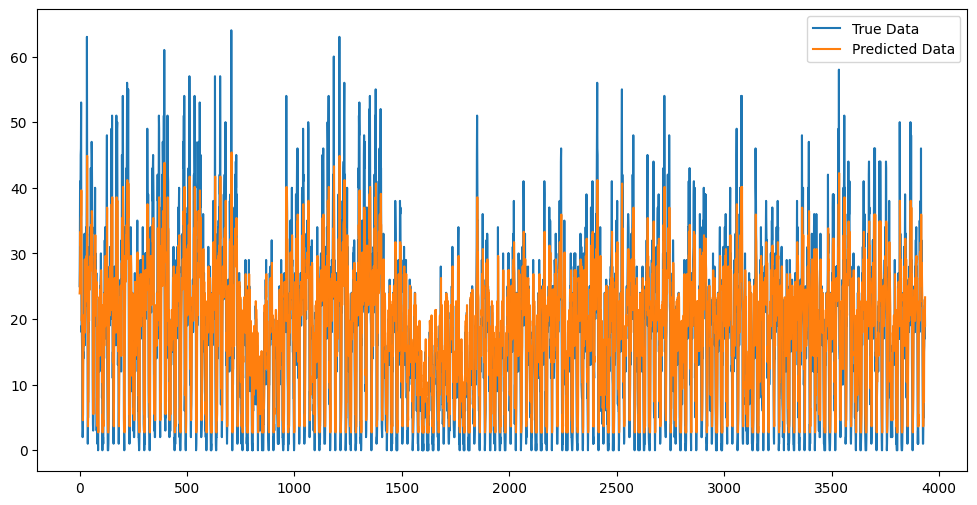

Zone:127, MSE: 0.1435920000076294, SMAPE: 1.9481836557388306


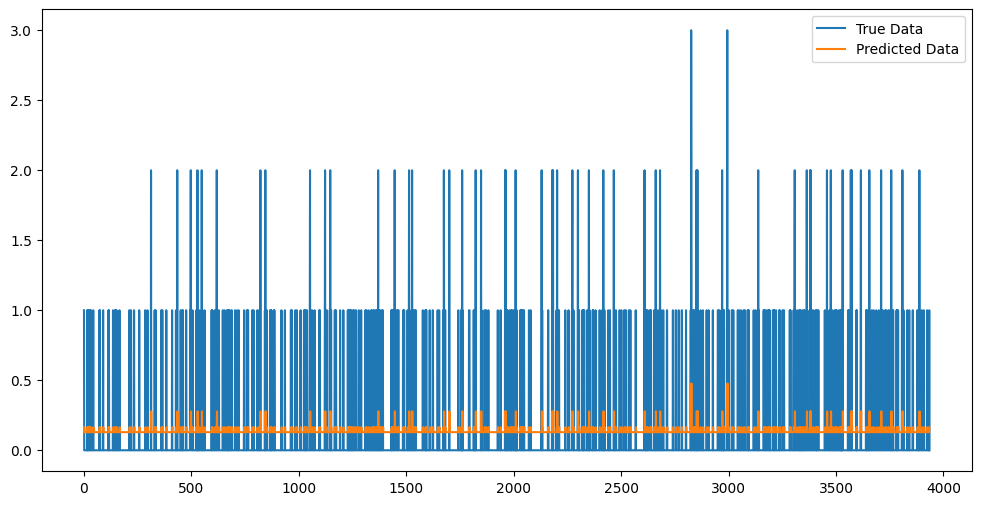

Zone:128, MSE: 0.012524678371846676, SMAPE: 1.9993489980697632


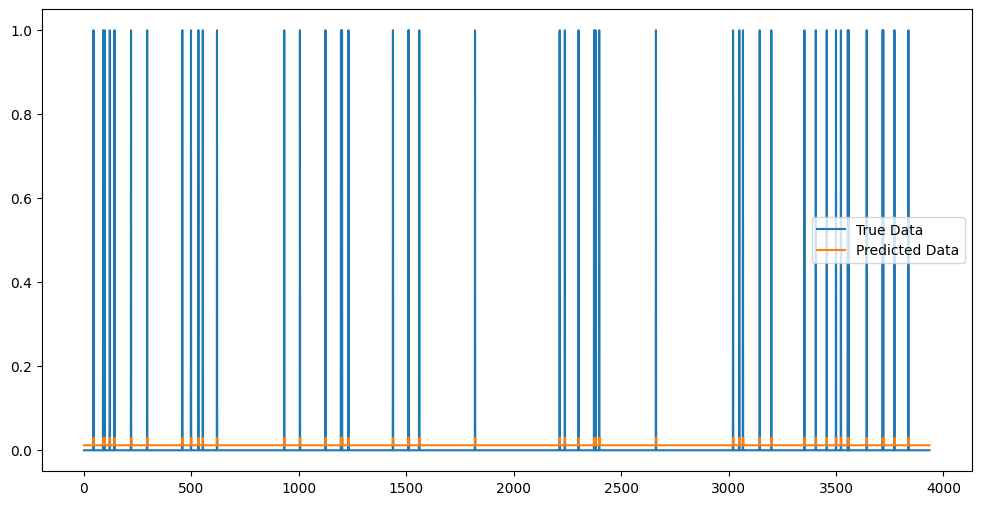

Zone:137, MSE: 147.7867431640625, SMAPE: 0.38188400864601135


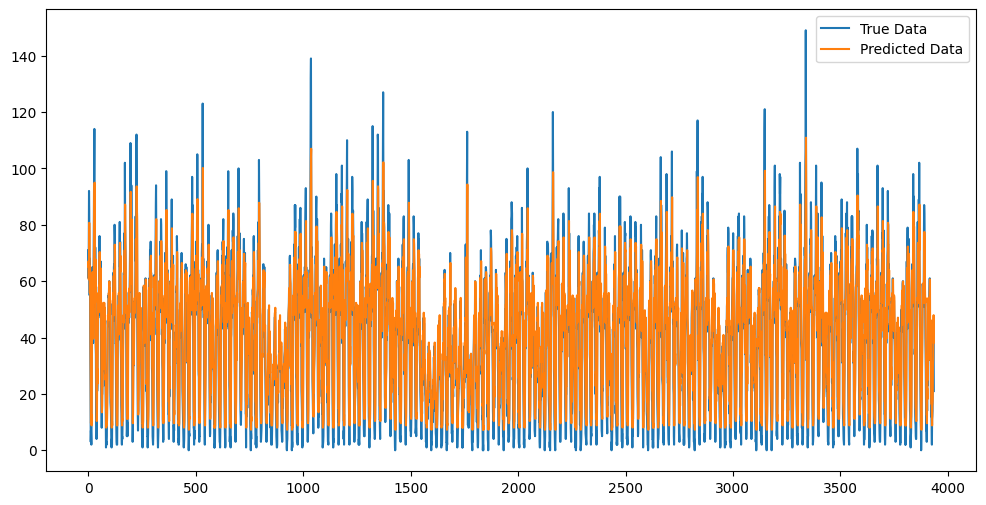

Zone:140, MSE: 568.0980834960938, SMAPE: 0.4533699154853821


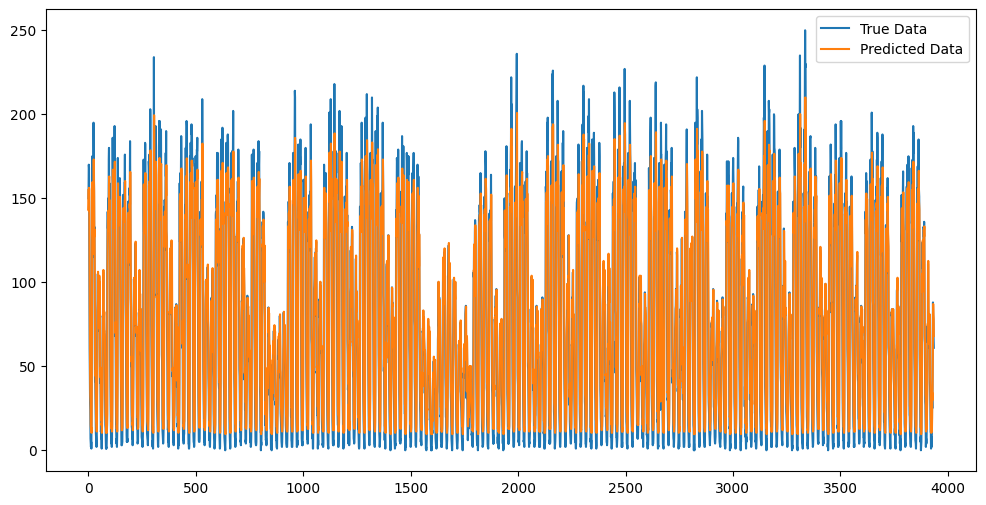

Zone:141, MSE: 649.1062622070312, SMAPE: 0.39196300506591797


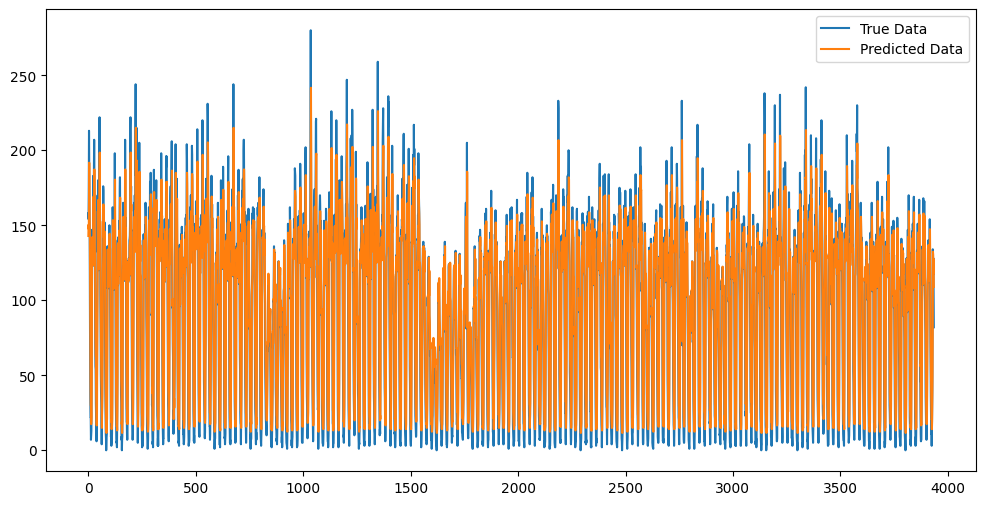

Zone:142, MSE: 2952.300048828125, SMAPE: 0.49448856711387634


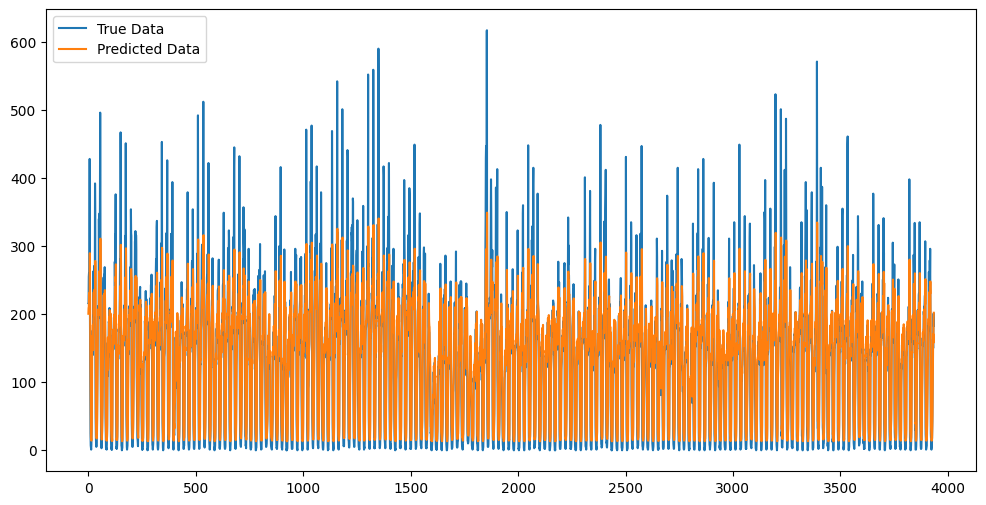

Zone:143, MSE: 234.2816925048828, SMAPE: 0.5433003902435303


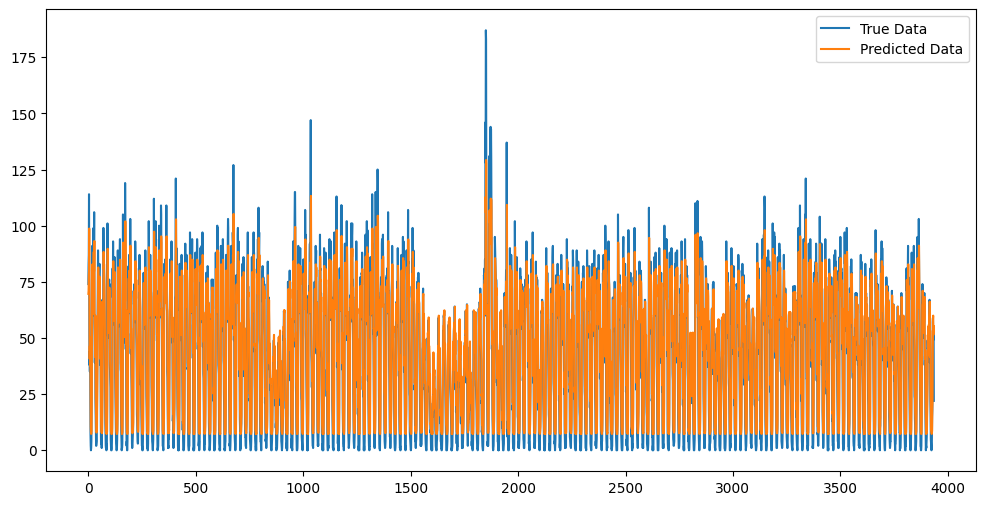

Zone:144, MSE: 199.77781677246094, SMAPE: 0.4907910227775574


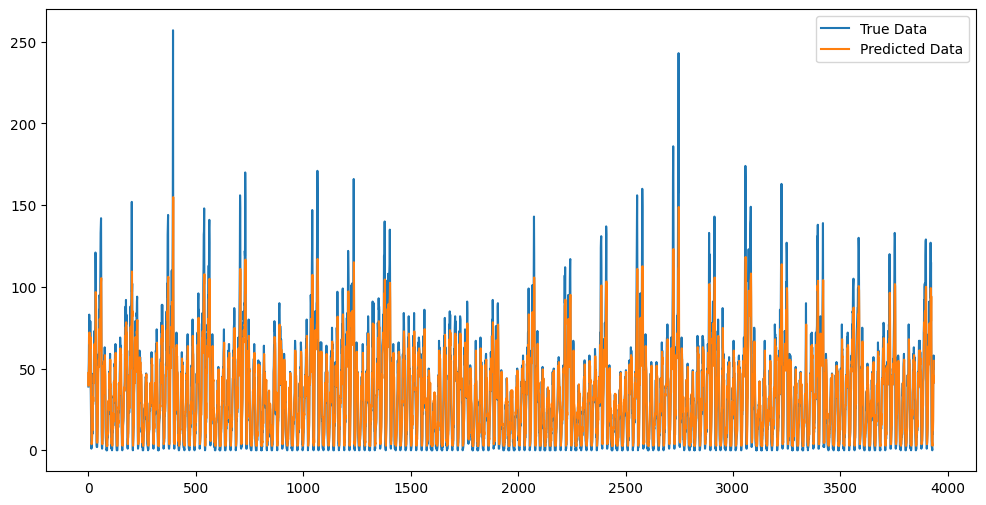

Zone:148, MSE: 589.6340942382812, SMAPE: 0.4457750916481018


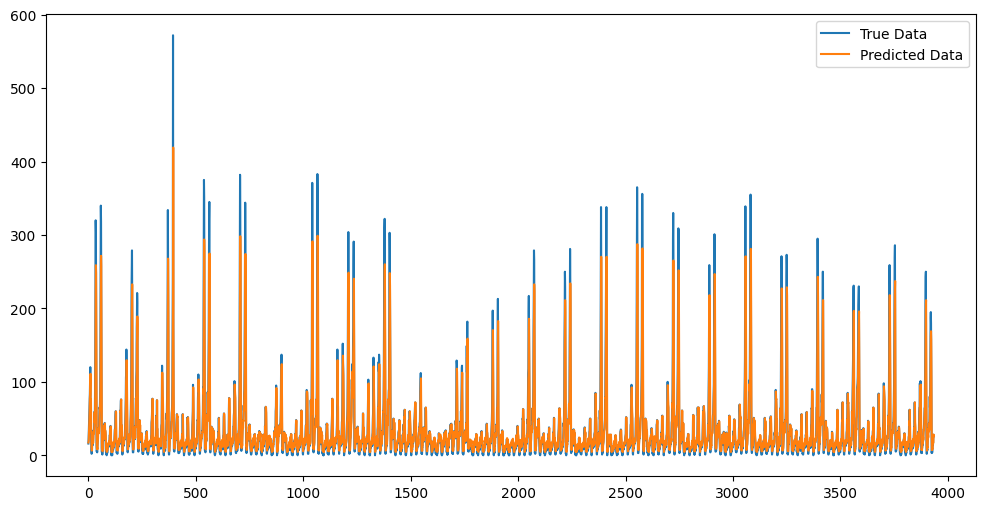

Zone:151, MSE: 129.21939086914062, SMAPE: 0.5413710474967957


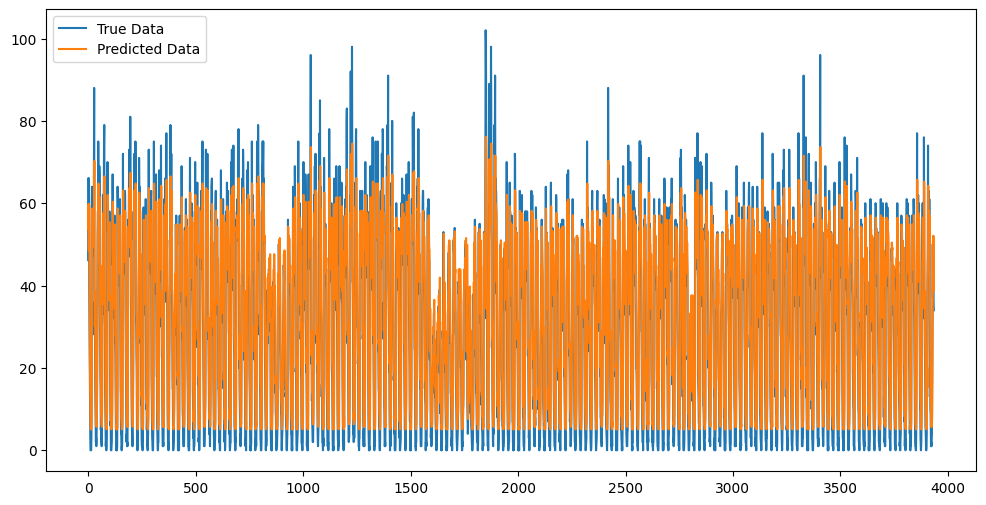

Zone:152, MSE: 3.591571569442749, SMAPE: 0.9538335800170898


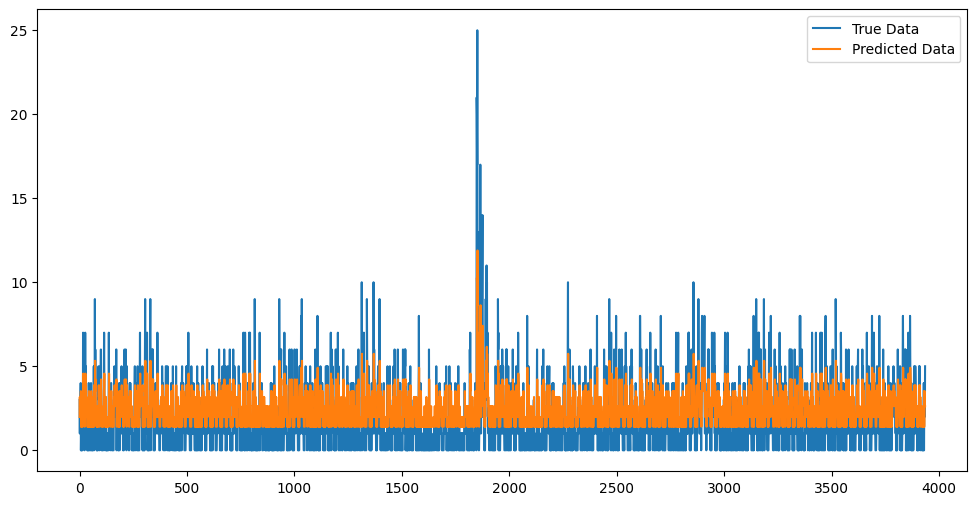

Zone:158, MSE: 179.32272338867188, SMAPE: 0.47631654143333435


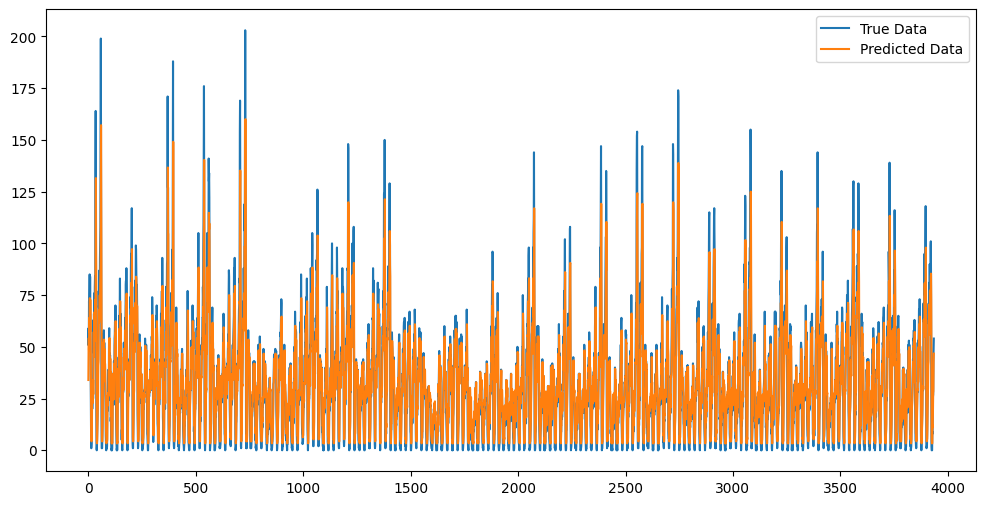

Zone:161, MSE: 2939.843994140625, SMAPE: 0.4747077226638794


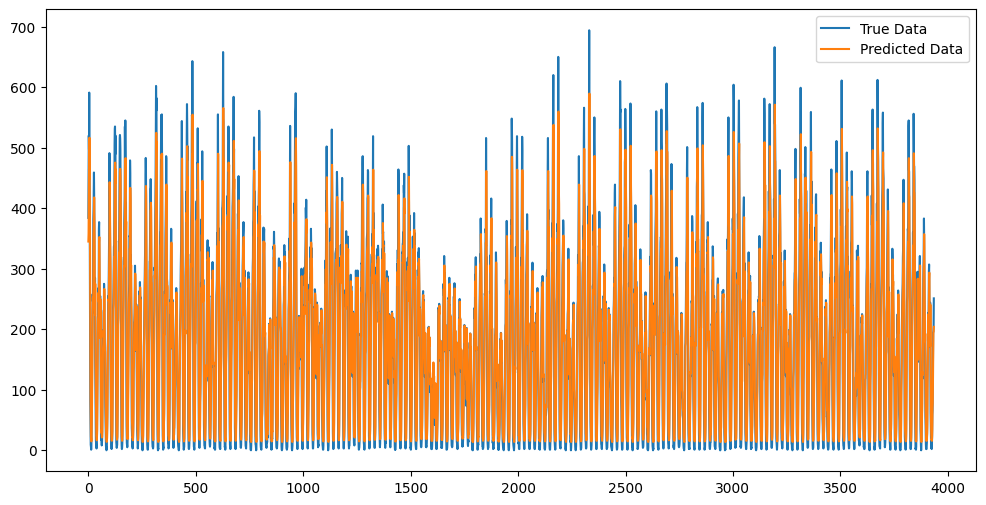

Zone:162, MSE: 1725.3118896484375, SMAPE: 0.42158398032188416


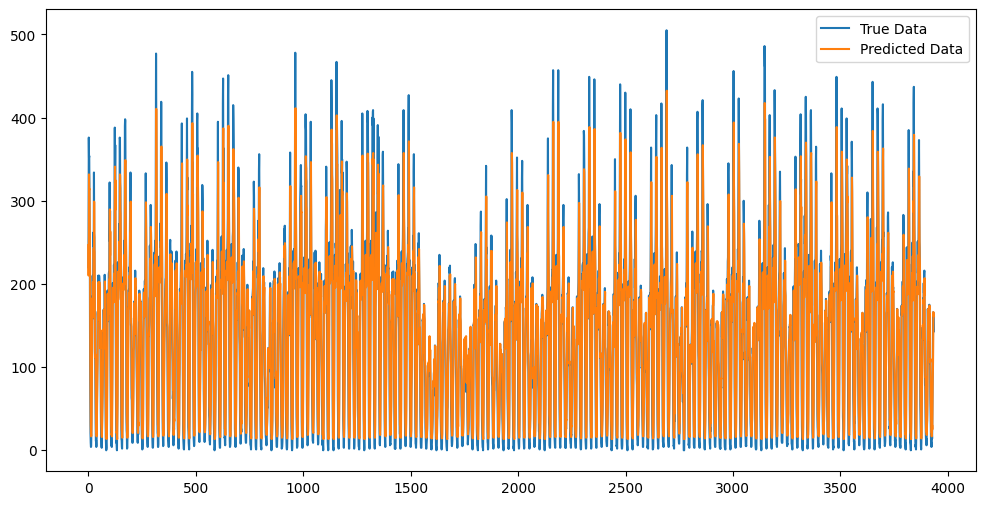

Zone:163, MSE: 1238.1038818359375, SMAPE: 0.42125529050827026


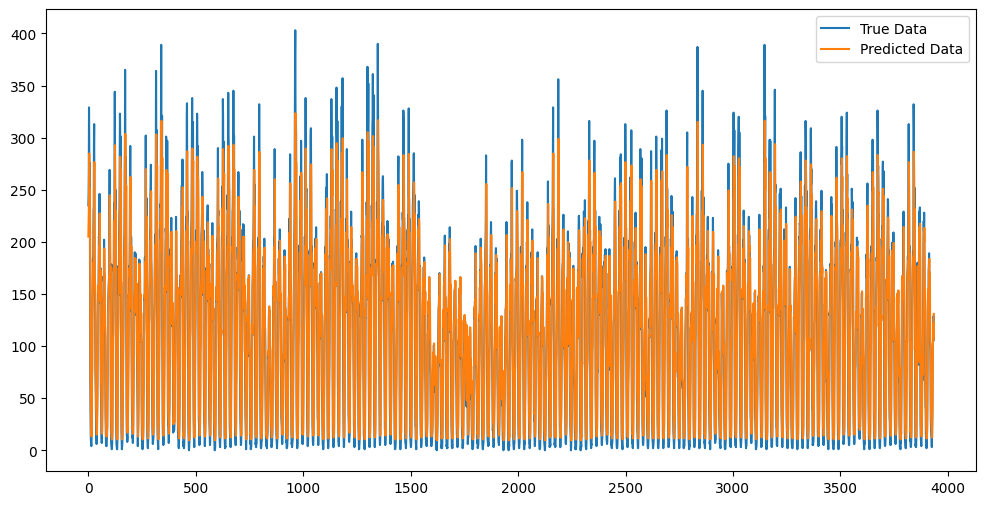

Zone:164, MSE: 623.6415405273438, SMAPE: 0.3628603518009186


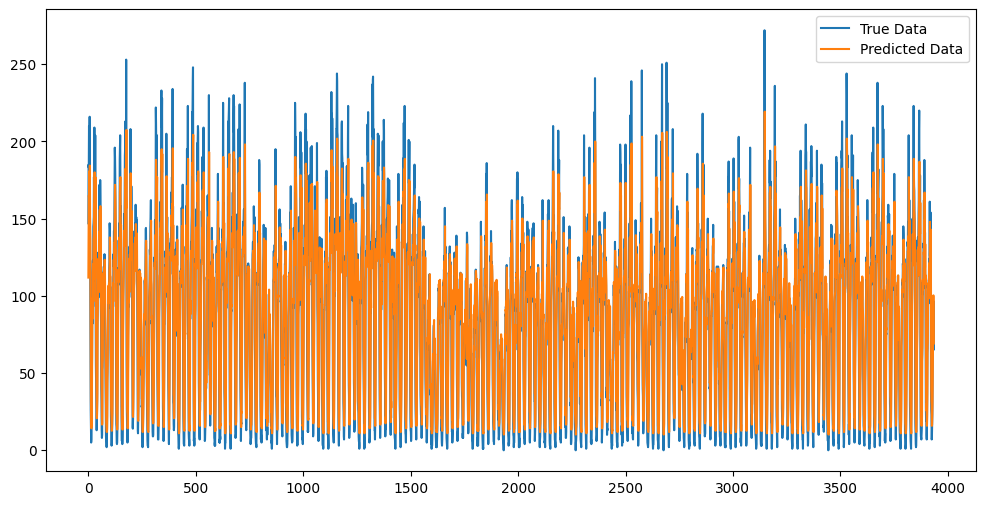

Zone:166, MSE: 54.43720626831055, SMAPE: 0.5710071921348572


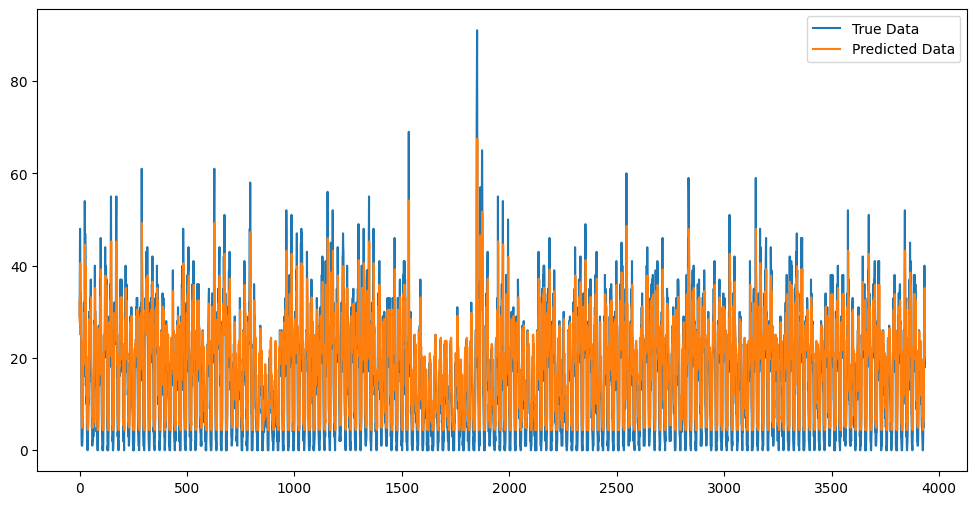

Zone:170, MSE: 882.7610473632812, SMAPE: 0.41284018754959106


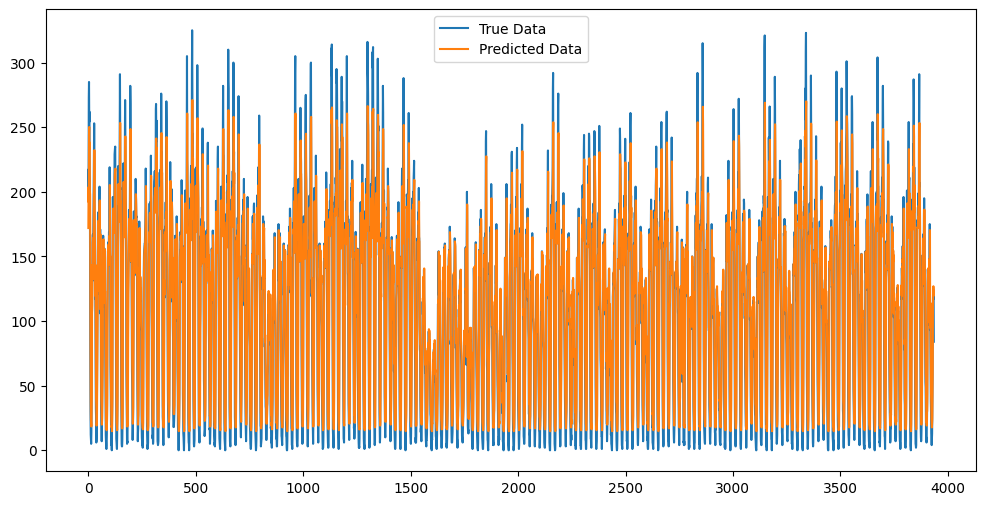

Zone:186, MSE: 1765.4329833984375, SMAPE: 0.3812086582183838


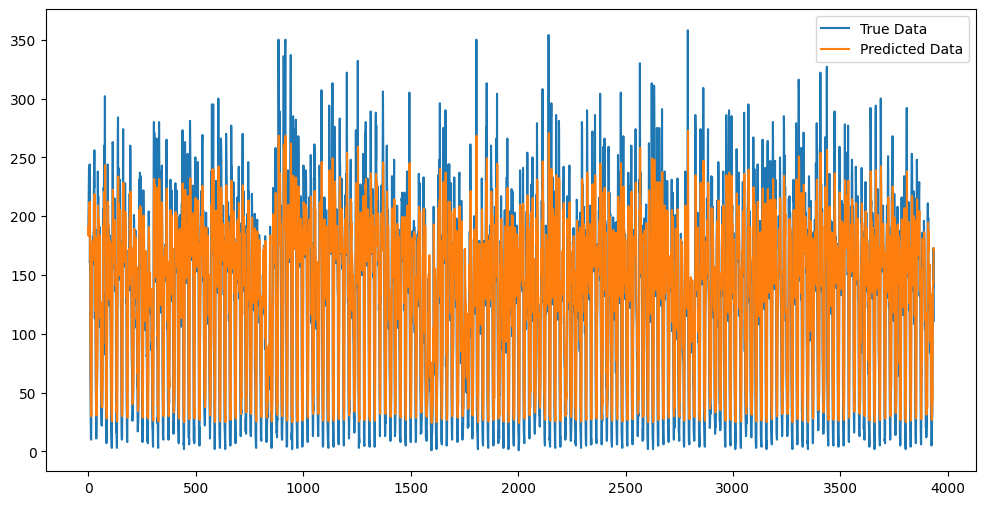

Zone:209, MSE: 12.856829643249512, SMAPE: 0.7298164963722229


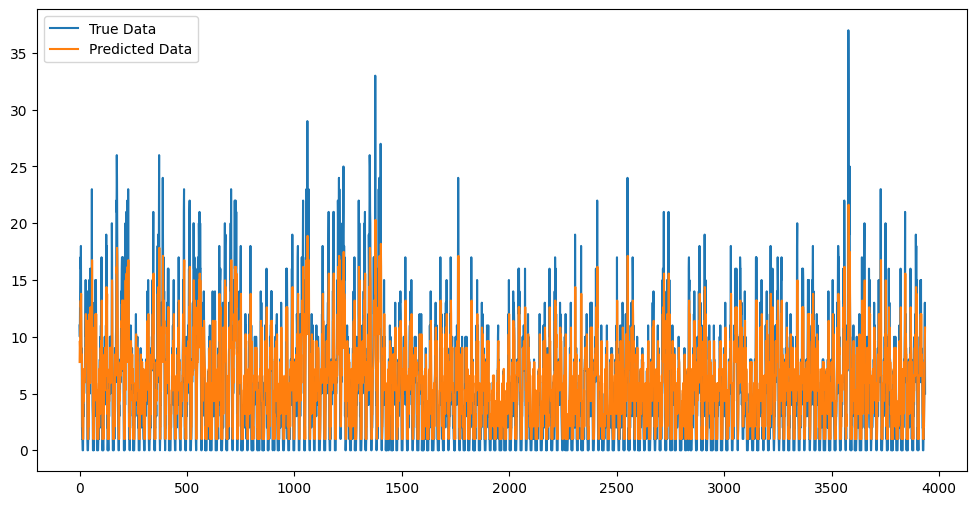

Zone:211, MSE: 119.55384826660156, SMAPE: 0.48976966738700867


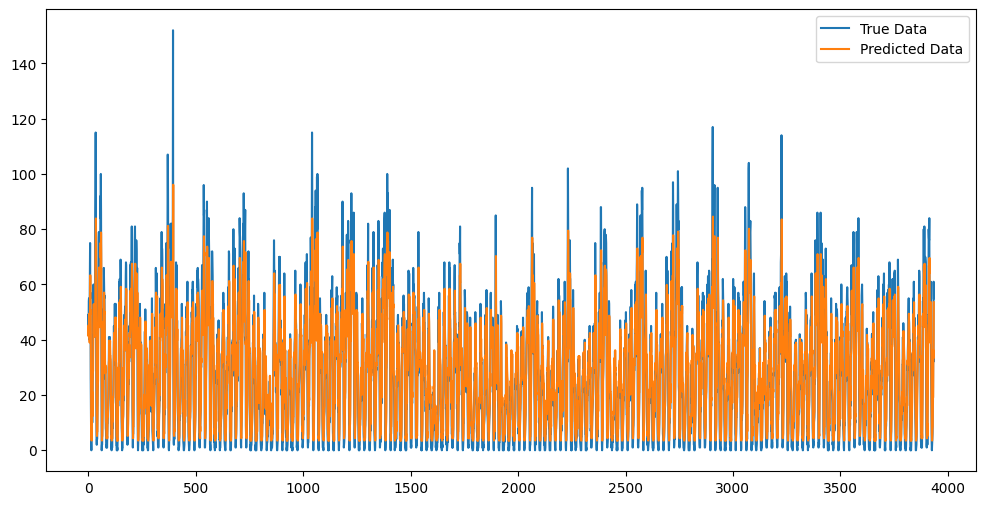

Zone:224, MSE: 7.704366683959961, SMAPE: 0.7254576086997986


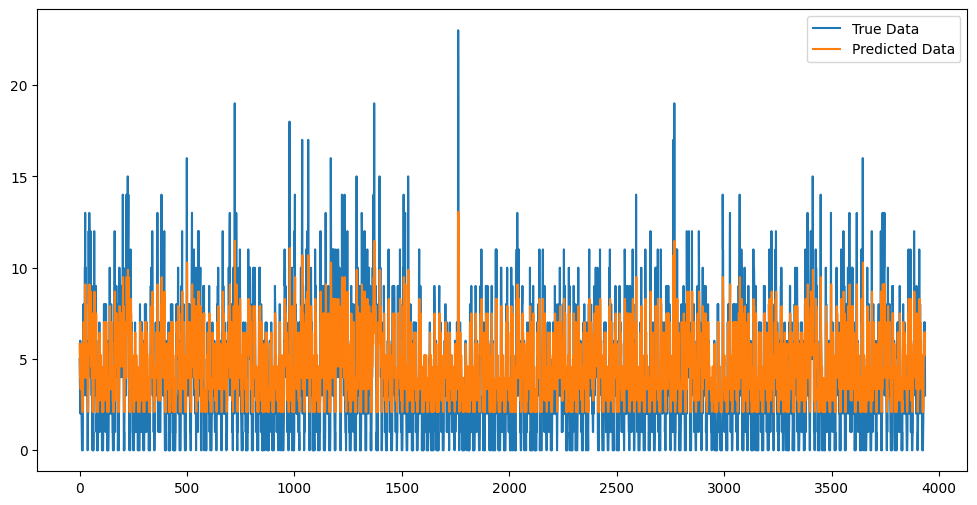

Zone:229, MSE: 473.1534423828125, SMAPE: 0.4003121256828308


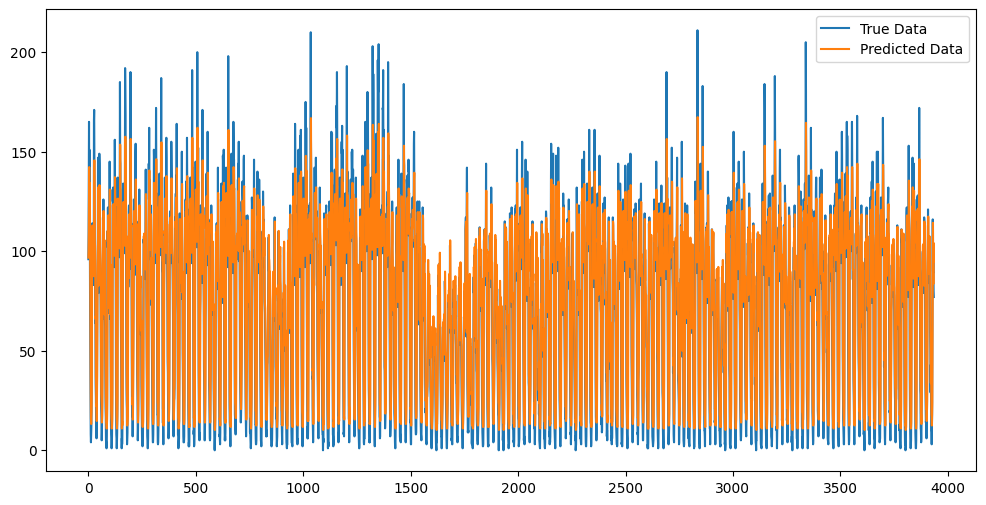

Zone:230, MSE: 1837.0089111328125, SMAPE: 0.3658219575881958


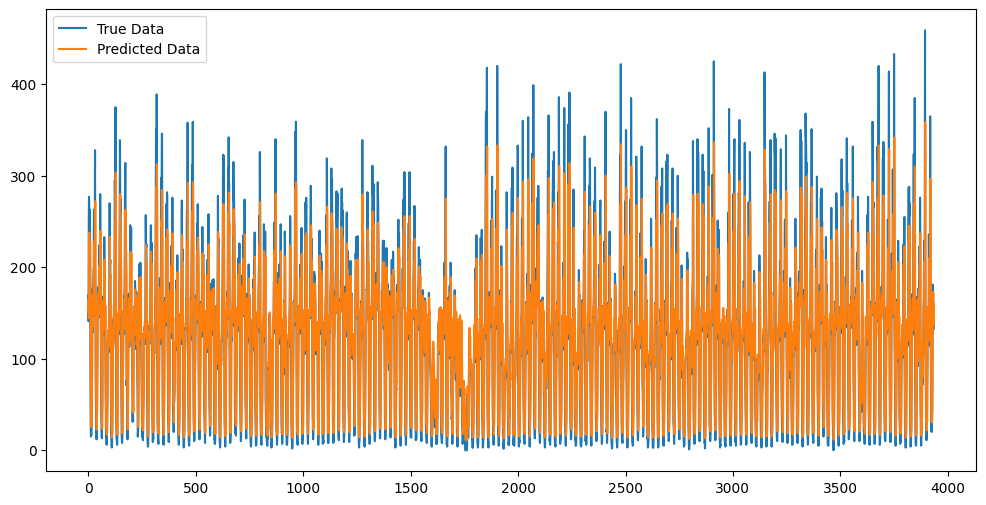

Zone:231, MSE: 247.0143280029297, SMAPE: 0.4405577778816223


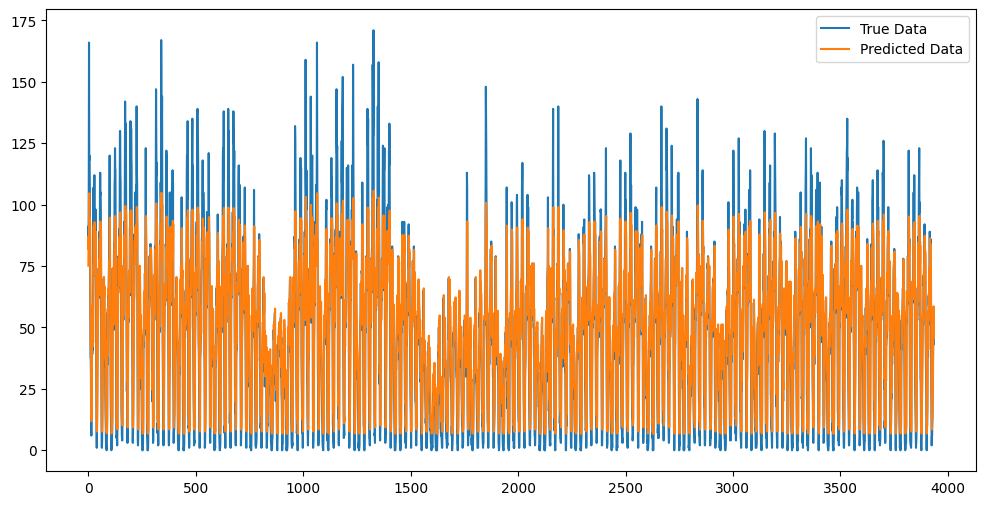

Zone:232, MSE: 8.911720275878906, SMAPE: 0.7919908165931702


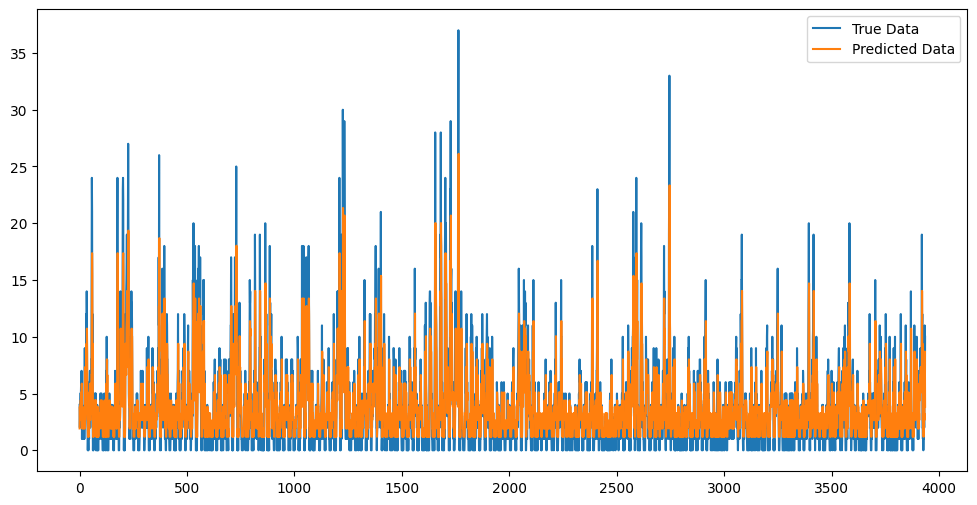

Zone:233, MSE: 234.92947387695312, SMAPE: 0.4650883376598358


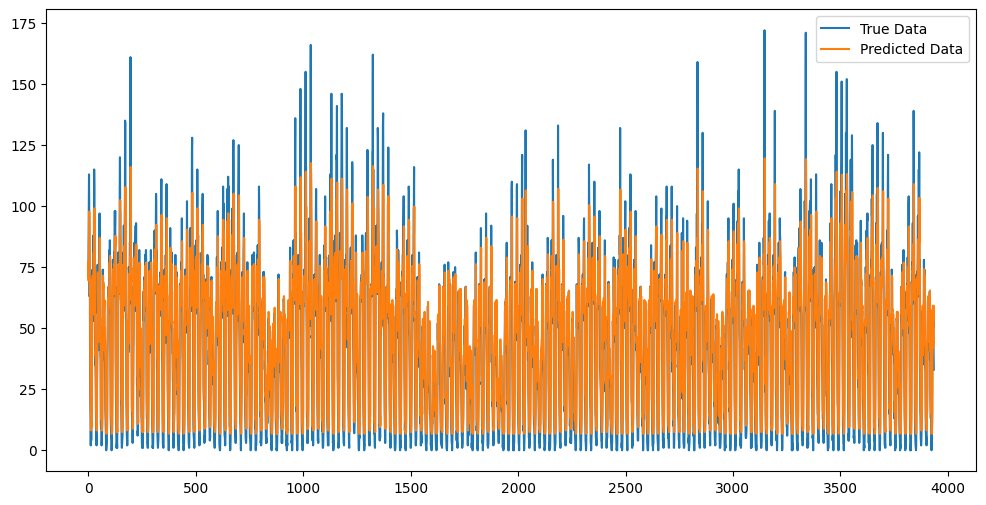

Zone:234, MSE: 812.7513427734375, SMAPE: 0.43835294246673584


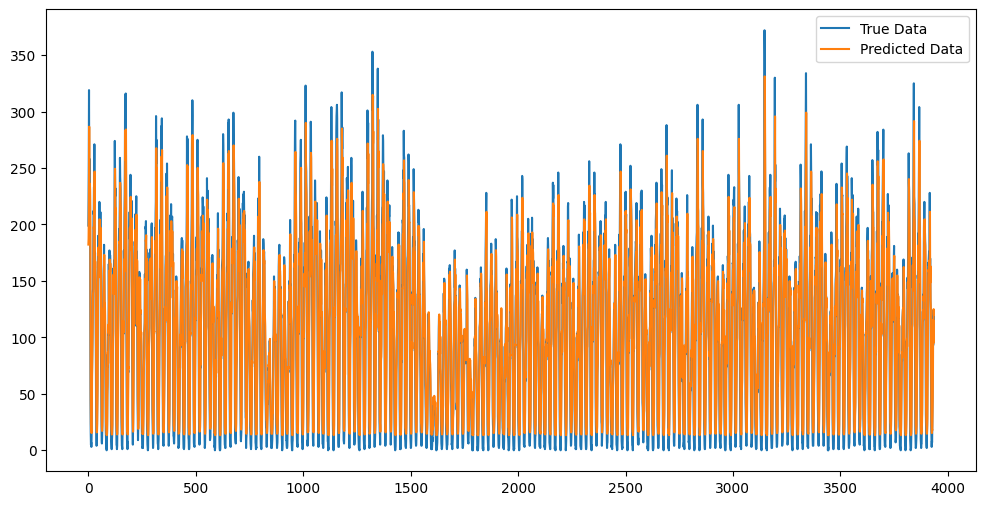

Zone:236, MSE: 2986.145263671875, SMAPE: 0.5715610980987549


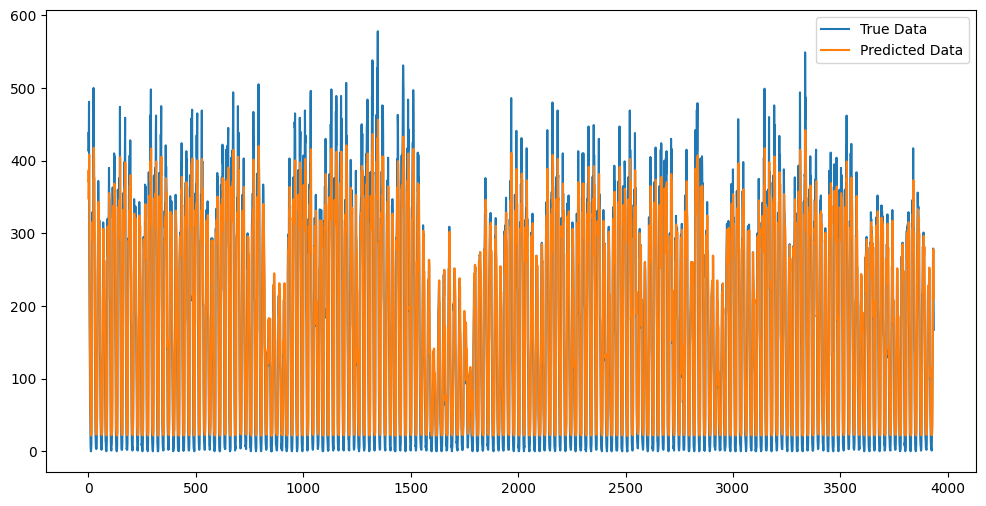

Zone:237, MSE: 2831.531005859375, SMAPE: 0.5008578300476074


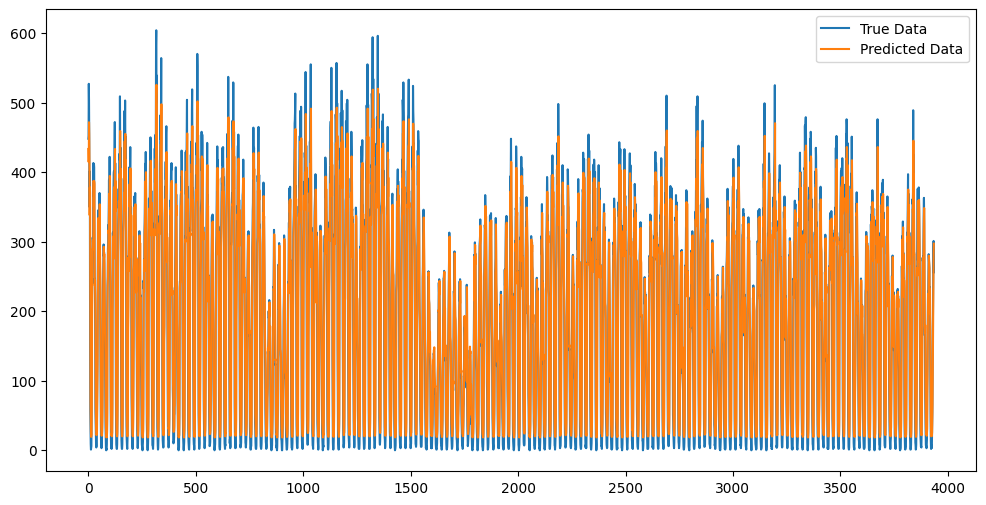

Zone:238, MSE: 616.4418334960938, SMAPE: 0.47964712977409363


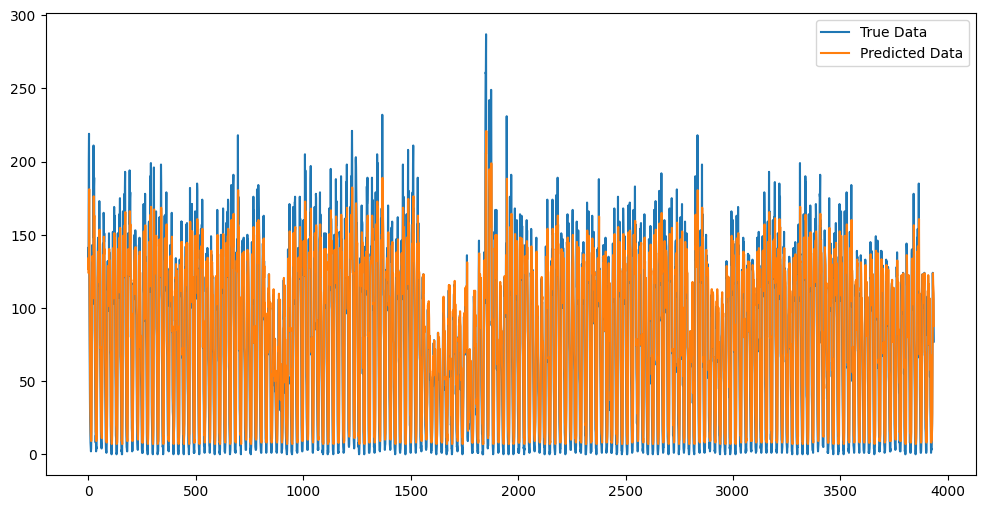

Zone:239, MSE: 1073.14501953125, SMAPE: 0.4562408924102783


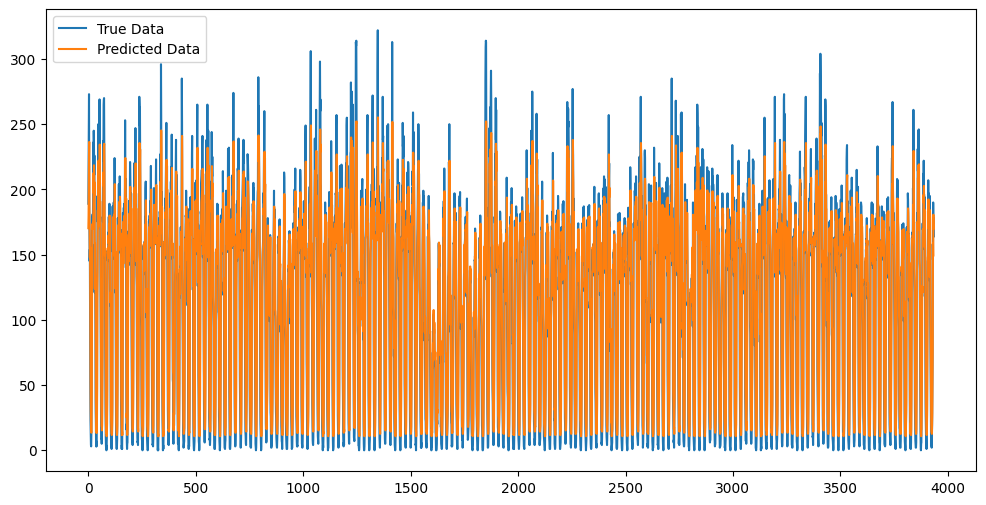

Zone:243, MSE: 0.37904781103134155, SMAPE: 1.7756556272506714


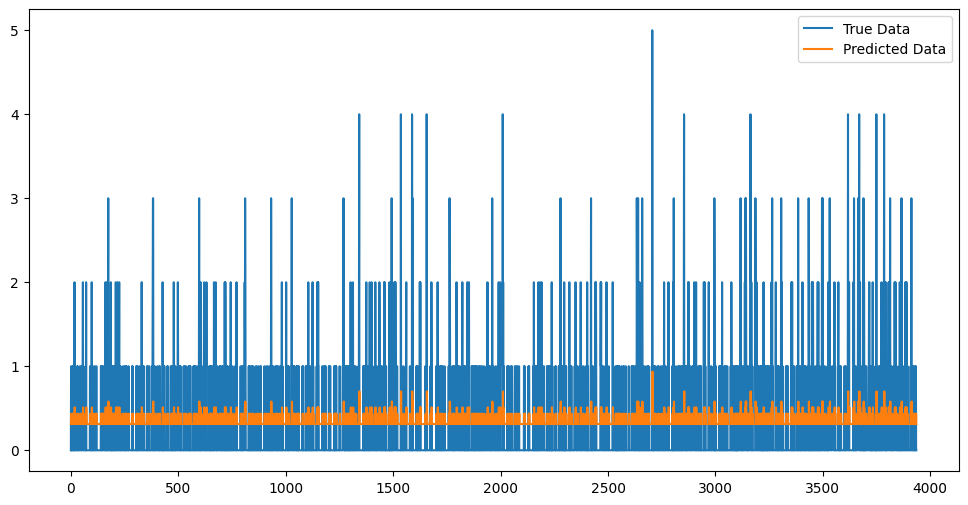

Zone:244, MSE: 2.8172593116760254, SMAPE: 1.0209529399871826


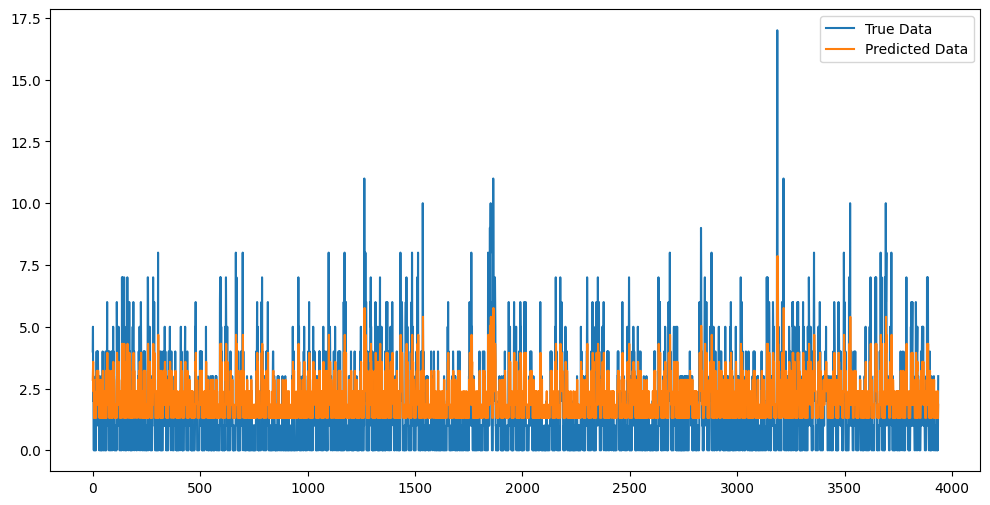

Zone:246, MSE: 522.2529296875, SMAPE: 0.44055524468421936


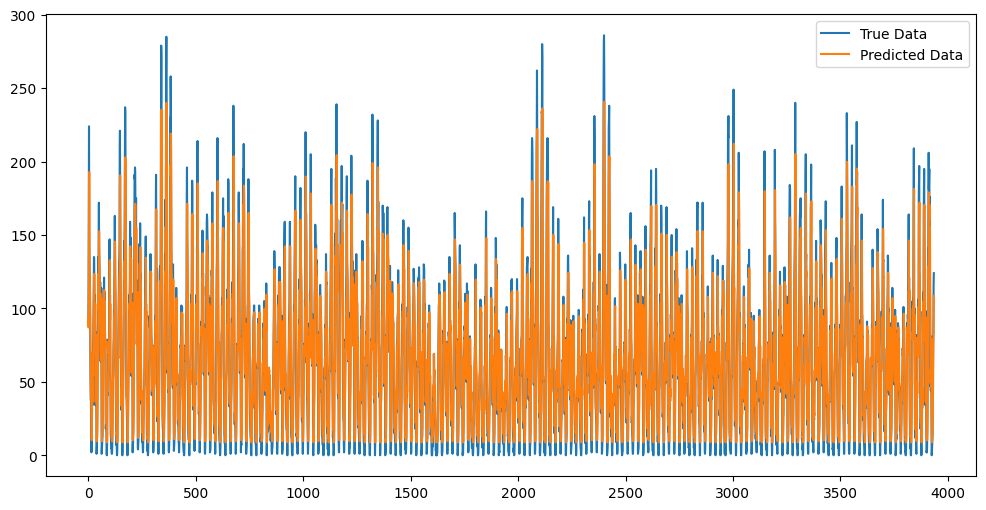

Zone:249, MSE: 1102.7222900390625, SMAPE: 0.3689553439617157


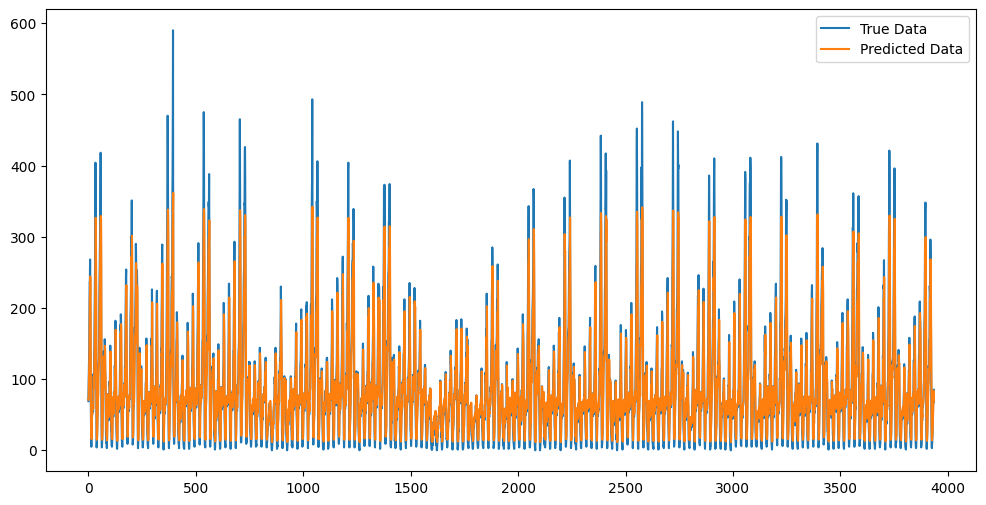

Zone:261, MSE: 54.31817626953125, SMAPE: 0.6014220118522644


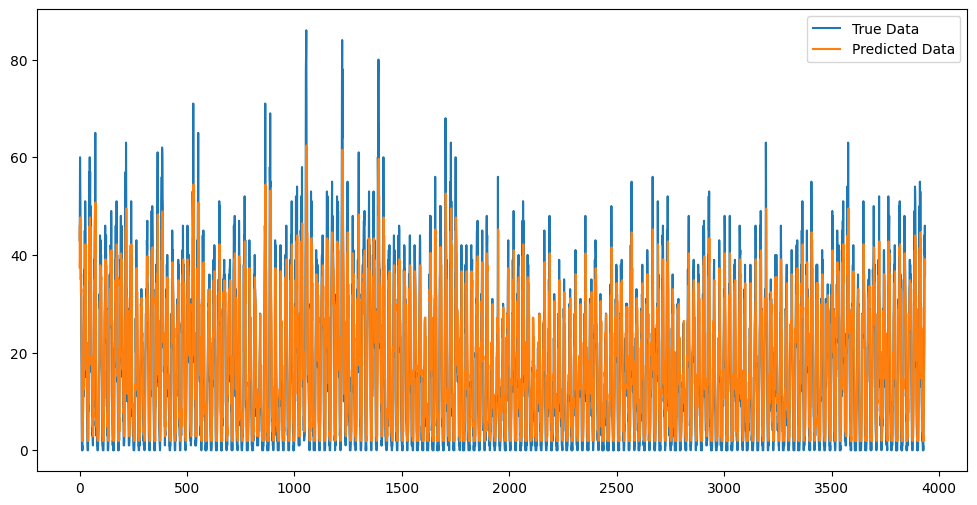

Zone:262, MSE: 370.6392517089844, SMAPE: 0.5332446098327637


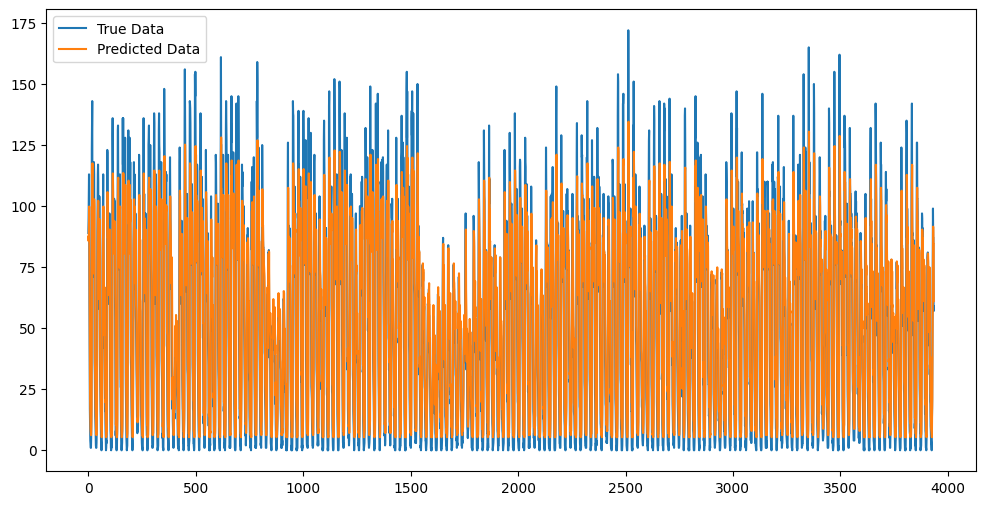

Zone:263, MSE: 431.3091735839844, SMAPE: 0.36910316348075867


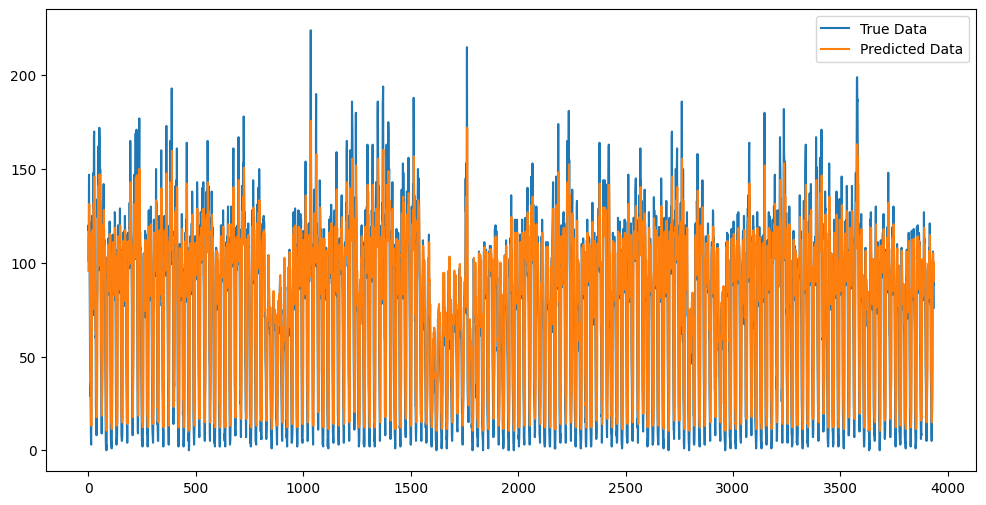

In [33]:
# Model evaluation on test data for each zone
all_predictions = []
mse_total=0
smape_total=0

for zone in zones:
    model = models[zone]
    test_loader = test_loaders[zone]
    test_time = times[zone]
    scaler = scalers[zone]
    model.eval()
    with torch.no_grad():
        test_preds = []
        test_labels = []

        for batch_X, batch_y in test_loader:
            preds = model(batch_X)
            test_preds.append(preds)
            test_labels.append(batch_y)

        test_preds = torch.cat(test_preds, dim=0)
        test_labels = torch.cat(test_labels, dim=0)

        # Inverse transform to get the original scale
        test_preds = scaler.inverse_transform(test_preds.numpy().reshape(-1, 1))
        test_labels = scaler.inverse_transform(test_labels.numpy().reshape(-1, 1))

        test_preds = test_preds.flatten()
        test_labels = test_labels.flatten()

        mse_zone = mean_squared_error(test_preds, test_labels)
        smape_zone = smape(test_preds, test_labels)
        print(f'Zone:{zone}, MSE: {mse_zone}, SMAPE: {smape_zone}')
        mse_total+=mse_zone
        smape_total+=smape_zone

        test_time_1 = test_time[:len(test_preds)]


        zone_predictions = pd.DataFrame({
        'Zone ID': [zone] * len(test_preds),  # Repeat zone ID for each prediction
        'Time': test_time_1,  # Assuming test_labels has a time index
        'Predicted taxi ride count': test_preds})

        all_predictions.append(zone_predictions)

        plt.figure(figsize=(12, 6))
        plt.plot(range(len(test_labels)), test_labels, label='True Data')
        plt.plot(range(len(test_preds)), test_preds, label='Predicted Data')
        plt.legend()
        plt.show()

In [34]:
predictions = pd.concat(all_predictions, ignore_index=True)
predictions.to_csv('MLP_predictions.csv', index=False)

# **Overall model performance on all test zone data across all zones**

In [35]:
mse_overall=mse_total/len(zones)
smape_overall=smape_total/len(zones)
print(f'MSE over all zones: {mse_overall}, SMAPE over all zones: {smape_overall}')
#makes sense as each zone has the same number of test data points

MSE over all zones: 555.9629648380602, SMAPE over all zones: 0.633591416809294
